**WARNING**: Remember to run the `ExtractBoundaries` notebook present in step2b folder before running all (or specifically the `Import Boundaries` cell)

**WARNING2**: You should also run `Generate Class Masks` from step 4b

In [18]:
SAVE_ON_DRIVE = True # Set to True if you want to save the datasets and trained models to your Google Drive

# Dataset initialization


### Download Data

In [19]:
from google.colab import drive
import os
import shutil

drive.mount('/content/drive')

# Set paths for Validation and Test datasets
val_dataset_path = '/content/drive/MyDrive/LoveDA/Val'
test_dataset_path = '/content/drive/MyDrive/LoveDA/Test'


# Function to handle dataset download and extraction
def handle_dataset(dataset_name, zip_url, local_path, drive_path, save_on_drive):
    if not os.path.exists(local_path):
        if os.path.exists(f"{drive_path}.zip"):
            print(f"{dataset_name} dataset available on own drive, unzipping...")
            !unzip -q {drive_path}.zip -d ./
        else:
            print(f"Downloading {dataset_name} dataset...")
            !wget -O {dataset_name}.zip "{zip_url}"
            if save_on_drive:
                print(f"Saving {dataset_name} dataset on drive...")
                !cp {dataset_name}.zip {drive_path}.zip
                print(f"{dataset_name} dataset saved on drive")
            print(f"Unzipping {dataset_name} dataset...")
            !unzip -q {dataset_name}.zip -d ./
    else:
        print(f"{dataset_name} dataset already in local")

# Handle Validation dataset
handle_dataset("Validation", "https://zenodo.org/records/5706578/files/Val.zip?download=1", "./Val", "/content/drive/MyDrive/LoveDA/Val", False)

# Handle Test dataset
#handle_dataset("Test", "https://zenodo.org/records/5706578/files/Test.zip?download=1", "./Test", "/content/drive/MyDrive/LoveDA/Test", False)

# Handle Train dataset
handle_dataset("Train", "https://zenodo.org/records/5706578/files/Train.zip?download=1", "./Train", "/content/drive/MyDrive/LoveDA/Train", SAVE_ON_DRIVE)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Validation dataset already in local
Train dataset already in local


### Import Boundaries

In [20]:
# Paths
rural_boundaries_path = "./Train/Rural/boundaries_png"
rural_masks_path = './Train/Rural/masks_png'

urban_boundaries_path = "./Train/Urban/boundaries_png"
urban_masks_path = './Train/Urban/masks_png'
drive_rural_boundaries_path = '/content/drive/MyDrive/LoveDA/boundaries/Rural/boundaries_png'
drive_urban_boundaries_path = '/content/drive/MyDrive/LoveDA/boundaries/Urban/boundaries_png'

boundaries_paths = [rural_boundaries_path, urban_boundaries_path]

# Make dir inside ./Train/...
for boundaries_path in boundaries_paths:
    if (os.path.exists(boundaries_path) == False):
        print(f"Creating {boundaries_path}...")
        os.makedirs(boundaries_path)
    else:
        print(f"{boundaries_path} exists...")


# Check if files are already present
# rural_file_count = len([name for name in os.listdir(rural_boundaries_path) if os.path.isfile(os.path.join(rural_boundaries_path, name))])
# rural_mask_file_count = len([name for name in os.listdir(rural_masks_path) if os.path.isfile(os.path.join(rural_masks_path, name))])
urban_file_count = len([name for name in os.listdir(urban_boundaries_path) if os.path.isfile(os.path.join(urban_boundaries_path, name))])
urban_mask_file_count = len([name for name in os.listdir(urban_masks_path) if os.path.isfile(os.path.join(urban_masks_path, name))])

# if (rural_file_count != rural_mask_file_count):
#     print(f"Importing boundaries, as we have {rural_file_count} rural boundaries as of now...")
#     shutil.copytree(drive_rural_boundaries_path, rural_boundaries_path, dirs_exist_ok=True)
# else:
#     print(f"Rural boundaries already present, {rural_file_count} files...")

if (urban_file_count != urban_mask_file_count):
    print(f"Importing boundaries, as we have {urban_file_count} urban boundaries as of now...")
    shutil.copytree(drive_urban_boundaries_path, urban_boundaries_path, dirs_exist_ok=True)
else:
    print(f"Urban boundaries already present, {urban_file_count} files...")

./Train/Rural/boundaries_png exists...
./Train/Urban/boundaries_png exists...
Urban boundaries already present, 1156 files...


### Dataset Definition

In [21]:
import os
import numpy as np
from PIL import Image
from torch.utils.data import Dataset
import torchvision.transforms as T
import random
import cv2


def pil_loader(path, color_type):
    # open path as file to avoid ResourceWarning (https://github.com/python-pillow/Pillow/issues/835)
    with open(path, 'rb') as f:
        img = Image.open(f)
        return img.convert(color_type)

class LoveDADataset(Dataset):
    def __init__(self, baseTransform, augTransforms, split = 'Urban', type = 'Train', useBoundaries=True, validation_ratio=0.2, seed=265637):
        # Validate type input
        if type not in ['Train', 'Validation', 'Total', 'ActualTest']:
            raise ValueError("Invalid type. Expected 'Train' or 'Validation' or 'Total' or 'ActualTest'.")
        self.directory = []
        if type == 'ActualTest':
            directory_path = os.path.join('./Val', split, 'images_png')
        else:
            directory_path = os.path.join('./Train', split, 'images_png')
        # Check if the directory exists
        if not os.path.exists(directory_path):
            raise FileNotFoundError(f"Directory not found: {directory_path}")
        # Get all image paths
        all_images = [os.path.join(directory_path, entry) for entry in os.listdir(directory_path) if os.path.isfile(os.path.join(directory_path, entry))]
        # Shuffle images for random splitting
        random.seed(seed)
        random.shuffle(all_images)
        # Split into training and validation sets
        split_idx = int(len(all_images) * (1 - validation_ratio))
        if type == 'Train':
            self.directory = all_images[:split_idx]
        elif type == 'Validation':
            self.directory = all_images[split_idx:]
        elif type == 'Total':
            self.directory = all_images
        elif type == 'ActualTest':
            self.directory = all_images
        else:
            raise ValueError("Invalid type. Expected 'Train' or 'Validation' or 'Total' or 'ActualTest.")
        self.baseTransforms = baseTransform
        self.augTransforms = augTransforms
        self.useBoundaries = useBoundaries
        self.typeDataset = type
        # Print dataset size
        print(f"Dataset size: {len(self.directory)}")

    def __len__(self):
        return len(self.directory)

    def __getitem__(self, idx):
        image_path = self.directory[idx]
        image = pil_loader(image_path, 'RGB')
        mask_path = image_path.replace('images_png', 'masks_png')
        boundaries_path = image_path.replace('images_png', 'boundaries_png')

        mask = pil_loader(mask_path, 'L')

        if self.useBoundaries:
          boundaries = pil_loader(boundaries_path, 'L')
        else:
          boundaries = mask

        base_transformed = self.baseTransforms(image=np.array(image), mask=np.array(mask), boundaries=np.array(boundaries))
        base_image = base_transformed['image']
        base_mask = base_transformed['mask']
        base_boundaries = base_transformed['boundaries']

        base_image = T.Compose([T.ToTensor()])(base_image)
        base_mask = torch.from_numpy(base_mask).long()
        base_mask -= 1
        base_boundaries = torch.from_numpy(base_boundaries)

        if(self.typeDataset != 'Train'):
          return base_image, base_mask, image_path, base_boundaries

        return [base_image], [base_mask], image_path, [base_boundaries]

### Dataset Utils

In [22]:
import matplotlib.patches as mpatches

from collections import OrderedDict
COLOR_MAP = OrderedDict(
    Background=(255, 255, 255),
    Building=(255, 0, 0),
    Road=(255, 255, 0),
    Water=(0, 0, 255),
    Barren=(159, 129, 183),
    Forest=(34, 139, 34),
    Agricultural=(255, 195, 128),
)

LABEL_MAP = OrderedDict(
    Background=0,
    Building=1,
    Road=2,
    Water=3,
    Barren=4,
    Forest=5,
    Agricultural=6,
)
inverted_label_map = OrderedDict((v, k) for k, v in LABEL_MAP.items())


def getLabelColor(label):
    # Default color for unclassified labels
    default_color = np.array([128, 128, 128])  # Gray

    # Check if label exists in inverted_label_map
    label_name = inverted_label_map.get(label, None)
    if label_name is None or label_name not in COLOR_MAP:
        return default_color  # Return default color for unclassified

    # Return the mapped color
    label_color = np.array(COLOR_MAP[label_name])
    return label_color


def getLegendHandles():
  handles = [mpatches.Patch(color=getLabelColor(i)/255, label=inverted_label_map[i]) for i in range(0, len(LABEL_MAP))]
  handles.append(mpatches.Patch(color=getLabelColor(-1)/255, label='Unclassified'))
  return handles

def new_colors_mask(mask):
  new_image = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)
  for i, row in enumerate(mask):
    for j, cell in enumerate(row):
      new_image[i][j] = getLabelColor(cell.item())
  return new_image



### Dataset Debug

In [23]:
# # Comment this cell to save GPU time

# import matplotlib.pyplot as plt
# import torch
# from torch.utils.data import DataLoader
# import matplotlib.patches as mpatches

# train_dataset = LoveDADataset(type='Train', seed=222)
# print(train_dataset.__len__())

# # Get item
# image, mask, path, bd = train_dataset.__getitem__(88)

# # Show path
# print(f"Image is at {path}")

# # Show image
# image = image.permute(1, 2, 0)
# image = image.numpy()
# plt.imshow(image)

# # Show mask
# new_image = new_colors_mask(mask)
# plt.imshow(image)
# plt.show()
# plt.legend(handles=getLegendHandles(), loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)
# plt.imshow(new_image)
# plt.show()

# # Show boundaries
# # for row in bd:
# #     for col in row:
# #         if col != 0 and col != 1:
# #             print(col)
# bd = bd.numpy()
# plt.imshow(bd)


# Initialize model

### STDC Net

In [24]:
import torch
import torch.nn as nn
from torch.nn import init
import math



class ConvX(nn.Module):
    def __init__(self, in_planes, out_planes, kernel=3, stride=1):
        super(ConvX, self).__init__()
        self.conv = nn.Conv2d(in_planes, out_planes, kernel_size=kernel, stride=stride, padding=kernel//2, bias=False)
        self.bn = nn.BatchNorm2d(out_planes)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        out = self.relu(self.bn(self.conv(x)))
        return out


class AddBottleneck(nn.Module):
    def __init__(self, in_planes, out_planes, block_num=3, stride=1):
        super(AddBottleneck, self).__init__()
        assert block_num > 1, print("block number should be larger than 1.")
        self.conv_list = nn.ModuleList()
        self.stride = stride
        if stride == 2:
            self.avd_layer = nn.Sequential(
                nn.Conv2d(out_planes//2, out_planes//2, kernel_size=3, stride=2, padding=1, groups=out_planes//2, bias=False),
                nn.BatchNorm2d(out_planes//2),
            )
            self.skip = nn.Sequential(
                nn.Conv2d(in_planes, in_planes, kernel_size=3, stride=2, padding=1, groups=in_planes, bias=False),
                nn.BatchNorm2d(in_planes),
                nn.Conv2d(in_planes, out_planes, kernel_size=1, bias=False),
                nn.BatchNorm2d(out_planes),
            )
            stride = 1

        for idx in range(block_num):
            if idx == 0:
                self.conv_list.append(ConvX(in_planes, out_planes//2, kernel=1))
            elif idx == 1 and block_num == 2:
                self.conv_list.append(ConvX(out_planes//2, out_planes//2, stride=stride))
            elif idx == 1 and block_num > 2:
                self.conv_list.append(ConvX(out_planes//2, out_planes//4, stride=stride))
            elif idx < block_num - 1:
                self.conv_list.append(ConvX(out_planes//int(math.pow(2, idx)), out_planes//int(math.pow(2, idx+1))))
            else:
                self.conv_list.append(ConvX(out_planes//int(math.pow(2, idx)), out_planes//int(math.pow(2, idx))))

    def forward(self, x):
        out_list = []
        out = x

        for idx, conv in enumerate(self.conv_list):
            if idx == 0 and self.stride == 2:
                out = self.avd_layer(conv(out))
            else:
                out = conv(out)
            out_list.append(out)

        if self.stride == 2:
            x = self.skip(x)

        return torch.cat(out_list, dim=1) + x



class CatBottleneck(nn.Module):
    def __init__(self, in_planes, out_planes, block_num=3, stride=1):
        super(CatBottleneck, self).__init__()
        assert block_num > 1, print("block number should be larger than 1.")
        self.conv_list = nn.ModuleList()
        self.stride = stride
        if stride == 2:
            self.avd_layer = nn.Sequential(
                nn.Conv2d(out_planes//2, out_planes//2, kernel_size=3, stride=2, padding=1, groups=out_planes//2, bias=False),
                nn.BatchNorm2d(out_planes//2),
            )
            self.skip = nn.AvgPool2d(kernel_size=3, stride=2, padding=1)
            stride = 1

        for idx in range(block_num):
            if idx == 0:
                self.conv_list.append(ConvX(in_planes, out_planes//2, kernel=1))
            elif idx == 1 and block_num == 2:
                self.conv_list.append(ConvX(out_planes//2, out_planes//2, stride=stride))
            elif idx == 1 and block_num > 2:
                self.conv_list.append(ConvX(out_planes//2, out_planes//4, stride=stride))
            elif idx < block_num - 1:
                self.conv_list.append(ConvX(out_planes//int(math.pow(2, idx)), out_planes//int(math.pow(2, idx+1))))
            else:
                self.conv_list.append(ConvX(out_planes//int(math.pow(2, idx)), out_planes//int(math.pow(2, idx))))

    def forward(self, x):
        out_list = []
        out1 = self.conv_list[0](x)

        for idx, conv in enumerate(self.conv_list[1:]):
            if idx == 0:
                if self.stride == 2:
                    out = conv(self.avd_layer(out1))
                else:
                    out = conv(out1)
            else:
                out = conv(out)
            out_list.append(out)

        if self.stride == 2:
            out1 = self.skip(out1)
        out_list.insert(0, out1)

        out = torch.cat(out_list, dim=1)
        return out

#STDC2Net
class STDCNet1446(nn.Module):
    def __init__(self, base=64, layers=[4,5,3], block_num=4, type="cat", num_classes=1000, dropout=0.20, pretrain_model='', use_conv_last=False):
        super(STDCNet1446, self).__init__()
        if type == "cat":
            block = CatBottleneck
        elif type == "add":
            block = AddBottleneck
        self.use_conv_last = use_conv_last
        self.features = self._make_layers(base, layers, block_num, block)
        self.conv_last = ConvX(base*16, max(1024, base*16), 1, 1)
        self.gap = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Linear(max(1024, base*16), max(1024, base*16), bias=False)
        self.bn = nn.BatchNorm1d(max(1024, base*16))
        self.relu = nn.ReLU(inplace=True)
        self.dropout = nn.Dropout(p=dropout)
        self.linear = nn.Linear(max(1024, base*16), num_classes, bias=False)

        self.x2 = nn.Sequential(self.features[:1])
        self.x4 = nn.Sequential(self.features[1:2])
        self.x8 = nn.Sequential(self.features[2:6])
        self.x16 = nn.Sequential(self.features[6:11])
        self.x32 = nn.Sequential(self.features[11:])

        if pretrain_model:
            print('use pretrain model {}'.format(pretrain_model))
            self.init_weight(pretrain_model)
        else:
            self.init_params()

    def init_weight(self, pretrain_model):

        state_dict = torch.load(pretrain_model)["state_dict"]
        self_state_dict = self.state_dict()
        for k, v in state_dict.items():
            self_state_dict.update({k: v})
        self.load_state_dict(self_state_dict)

    def init_params(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                init.kaiming_normal_(m.weight, mode='fan_out')
                if m.bias is not None:
                    init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                init.constant_(m.weight, 1)
                init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                init.normal_(m.weight, std=0.001)
                if m.bias is not None:
                    init.constant_(m.bias, 0)

    def _make_layers(self, base, layers, block_num, block):
        features = []
        features += [ConvX(3, base//2, 3, 2)]
        features += [ConvX(base//2, base, 3, 2)]

        for i, layer in enumerate(layers):
            for j in range(layer):
                if i == 0 and j == 0:
                    features.append(block(base, base*4, block_num, 2))
                elif j == 0:
                    features.append(block(base*int(math.pow(2,i+1)), base*int(math.pow(2,i+2)), block_num, 2))
                else:
                    features.append(block(base*int(math.pow(2,i+2)), base*int(math.pow(2,i+2)), block_num, 1))

        return nn.Sequential(*features)

    def forward(self, x):
        feat2 = self.x2(x)
        feat4 = self.x4(feat2)
        feat8 = self.x8(feat4)
        feat16 = self.x16(feat8)
        feat32 = self.x32(feat16)
        if self.use_conv_last:
           feat32 = self.conv_last(feat32)

        return feat2, feat4, feat8, feat16, feat32

    def forward_impl(self, x):
        out = self.features(x)
        out = self.conv_last(out).pow(2)
        out = self.gap(out).flatten(1)
        out = self.fc(out)
        # out = self.bn(out)
        out = self.relu(out)
        # out = self.relu(self.bn(self.fc(out)))
        out = self.dropout(out)
        out = self.linear(out)
        return out

# STDC1Net
class STDCNet813(nn.Module):
    def __init__(self, base=64, layers=[2,2,2], block_num=4, type="cat", num_classes=1000, dropout=0.20, pretrain_model='', use_conv_last=False):
        super(STDCNet813, self).__init__()
        if type == "cat":
            block = CatBottleneck
        elif type == "add":
            block = AddBottleneck
        self.use_conv_last = use_conv_last
        self.features = self._make_layers(base, layers, block_num, block)
        self.conv_last = ConvX(base*16, max(1024, base*16), 1, 1)
        self.gap = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Linear(max(1024, base*16), max(1024, base*16), bias=False)
        self.bn = nn.BatchNorm1d(max(1024, base*16))
        self.relu = nn.ReLU(inplace=True)
        self.dropout = nn.Dropout(p=dropout)
        self.linear = nn.Linear(max(1024, base*16), num_classes, bias=False)

        self.x2 = nn.Sequential(self.features[:1])
        self.x4 = nn.Sequential(self.features[1:2])
        self.x8 = nn.Sequential(self.features[2:4])
        self.x16 = nn.Sequential(self.features[4:6])
        self.x32 = nn.Sequential(self.features[6:])

        if pretrain_model:
            print('use pretrain model {}'.format(pretrain_model))
            self.init_weight(pretrain_model)
        else:
            self.init_params()

    def init_weight(self, pretrain_model):

        state_dict = torch.load(pretrain_model)["state_dict"]
        self_state_dict = self.state_dict()
        for k, v in state_dict.items():
            self_state_dict.update({k: v})
        self.load_state_dict(self_state_dict)

    def init_params(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                init.kaiming_normal_(m.weight, mode='fan_out')
                if m.bias is not None:
                    init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                init.constant_(m.weight, 1)
                init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                init.normal_(m.weight, std=0.001)
                if m.bias is not None:
                    init.constant_(m.bias, 0)

    def _make_layers(self, base, layers, block_num, block):
        features = []
        features += [ConvX(3, base//2, 3, 2)]
        features += [ConvX(base//2, base, 3, 2)]

        for i, layer in enumerate(layers):
            for j in range(layer):
                if i == 0 and j == 0:
                    features.append(block(base, base*4, block_num, 2))
                elif j == 0:
                    features.append(block(base*int(math.pow(2,i+1)), base*int(math.pow(2,i+2)), block_num, 2))
                else:
                    features.append(block(base*int(math.pow(2,i+2)), base*int(math.pow(2,i+2)), block_num, 1))

        return nn.Sequential(*features)

    def forward(self, x):
        feat2 = self.x2(x)
        feat4 = self.x4(feat2)
        feat8 = self.x8(feat4)
        feat16 = self.x16(feat8)
        feat32 = self.x32(feat16)
        if self.use_conv_last:
           feat32 = self.conv_last(feat32)

        return feat2, feat4, feat8, feat16, feat32

    def forward_impl(self, x):
        out = self.features(x)
        out = self.conv_last(out).pow(2)
        out = self.gap(out).flatten(1)
        out = self.fc(out)
        # out = self.bn(out)
        out = self.relu(out)
        # out = self.relu(self.bn(self.fc(out)))
        out = self.dropout(out)
        out = self.linear(out)
        return out

### STDC Definition

In [25]:
#!/usr/bin/python
# -*- encoding: utf-8 -*-


import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision

BatchNorm2d = nn.BatchNorm2d

class ConvBNReLU(nn.Module):
    def __init__(self, in_chan, out_chan, ks=3, stride=1, padding=1, *args, **kwargs):
        super(ConvBNReLU, self).__init__()
        self.conv = nn.Conv2d(in_chan,
                out_chan,
                kernel_size = ks,
                stride = stride,
                padding = padding,
                bias = False)
        self.bn = BatchNorm2d(out_chan)
        #self.bn = BatchNorm2d(out_chan, activation='none')
        self.relu = nn.ReLU()
        self.init_weight()

    def forward(self, x):
        x = self.conv(x)
        x = self.bn(x)
        x = self.relu(x)
        return x

    def init_weight(self):
        for ly in self.children():
            if isinstance(ly, nn.Conv2d):
                nn.init.kaiming_normal_(ly.weight, a=1)
                if not ly.bias is None: nn.init.constant_(ly.bias, 0)


class BiSeNetOutput(nn.Module):
    def __init__(self, in_chan, mid_chan, n_classes, *args, **kwargs):
        super(BiSeNetOutput, self).__init__()
        self.conv = ConvBNReLU(in_chan, mid_chan, ks=3, stride=1, padding=1)
        self.conv_out = nn.Conv2d(mid_chan, n_classes, kernel_size=1, bias=False)
        self.init_weight()

    def forward(self, x):
        x = self.conv(x)
        x = self.conv_out(x)
        return x

    def init_weight(self):
        for ly in self.children():
            if isinstance(ly, nn.Conv2d):
                nn.init.kaiming_normal_(ly.weight, a=1)
                if not ly.bias is None: nn.init.constant_(ly.bias, 0)

    def get_params(self):
        wd_params, nowd_params = [], []
        for name, module in self.named_modules():
            if isinstance(module, (nn.Linear, nn.Conv2d)):
                wd_params.append(module.weight)
                if not module.bias is None:
                    nowd_params.append(module.bias)
            elif isinstance(module, BatchNorm2d):
                nowd_params += list(module.parameters())
        return wd_params, nowd_params


class AttentionRefinementModule(nn.Module):
    def __init__(self, in_chan, out_chan, *args, **kwargs):
        super(AttentionRefinementModule, self).__init__()
        self.conv = ConvBNReLU(in_chan, out_chan, ks=3, stride=1, padding=1)
        self.conv_atten = nn.Conv2d(out_chan, out_chan, kernel_size= 1, bias=False)
        self.bn_atten = BatchNorm2d(out_chan)
        #self.bn_atten = BatchNorm2d(out_chan, activation='none')

        self.sigmoid_atten = nn.Sigmoid()
        self.init_weight()

    def forward(self, x):
        feat = self.conv(x)
        atten = F.avg_pool2d(feat, feat.size()[2:])
        atten = self.conv_atten(atten)
        atten = self.bn_atten(atten)
        atten = self.sigmoid_atten(atten)
        out = torch.mul(feat, atten)
        return out

    def init_weight(self):
        for ly in self.children():
            if isinstance(ly, nn.Conv2d):
                nn.init.kaiming_normal_(ly.weight, a=1)
                if not ly.bias is None: nn.init.constant_(ly.bias, 0)


class ContextPath(nn.Module):
    def __init__(self, backbone='CatNetSmall', pretrain_model='', use_conv_last=False, *args, **kwargs):
        super(ContextPath, self).__init__()

        self.backbone_name = backbone
        if backbone == 'STDCNet1446':
            self.backbone = STDCNet1446(pretrain_model=pretrain_model, use_conv_last=use_conv_last)
            self.arm16 = AttentionRefinementModule(512, 128)
            inplanes = 1024
            if use_conv_last:
                inplanes = 1024
            self.arm32 = AttentionRefinementModule(inplanes, 128)
            self.conv_head32 = ConvBNReLU(128, 128, ks=3, stride=1, padding=1)
            self.conv_head16 = ConvBNReLU(128, 128, ks=3, stride=1, padding=1)
            self.conv_avg = ConvBNReLU(inplanes, 128, ks=1, stride=1, padding=0)

        elif backbone == 'STDCNet813':
            self.backbone = STDCNet813(pretrain_model=pretrain_model, use_conv_last=use_conv_last)
            self.arm16 = AttentionRefinementModule(512, 128)
            inplanes = 1024
            if use_conv_last:
                inplanes = 1024
            self.arm32 = AttentionRefinementModule(inplanes, 128)
            self.conv_head32 = ConvBNReLU(128, 128, ks=3, stride=1, padding=1)
            self.conv_head16 = ConvBNReLU(128, 128, ks=3, stride=1, padding=1)
            self.conv_avg = ConvBNReLU(inplanes, 128, ks=1, stride=1, padding=0)
        else:
            print("backbone is not in backbone lists")
            exit(0)

        self.init_weight()

    def forward(self, x):
        H0, W0 = x.size()[2:]

        feat2, feat4, feat8, feat16, feat32 = self.backbone(x)
        H8, W8 = feat8.size()[2:]
        H16, W16 = feat16.size()[2:]
        H32, W32 = feat32.size()[2:]

        avg = F.avg_pool2d(feat32, feat32.size()[2:])

        avg = self.conv_avg(avg)
        avg_up = F.interpolate(avg, (H32, W32), mode='nearest')

        feat32_arm = self.arm32(feat32)
        feat32_sum = feat32_arm + avg_up
        feat32_up = F.interpolate(feat32_sum, (H16, W16), mode='nearest')
        feat32_up = self.conv_head32(feat32_up)

        feat16_arm = self.arm16(feat16)
        feat16_sum = feat16_arm + feat32_up
        feat16_up = F.interpolate(feat16_sum, (H8, W8), mode='nearest')
        feat16_up = self.conv_head16(feat16_up)

        return feat2, feat4, feat8, feat16, feat16_up, feat32_up # x8, x16

    def init_weight(self):
        for ly in self.children():
            if isinstance(ly, nn.Conv2d):
                nn.init.kaiming_normal_(ly.weight, a=1)
                if not ly.bias is None: nn.init.constant_(ly.bias, 0)

    def get_params(self):
        wd_params, nowd_params = [], []
        for name, module in self.named_modules():
            if isinstance(module, (nn.Linear, nn.Conv2d)):
                wd_params.append(module.weight)
                if not module.bias is None:
                    nowd_params.append(module.bias)
            elif isinstance(module, BatchNorm2d):
                nowd_params += list(module.parameters())
        return wd_params, nowd_params


class FeatureFusionModule(nn.Module):
    def __init__(self, in_chan, out_chan, *args, **kwargs):
        super(FeatureFusionModule, self).__init__()
        self.convblk = ConvBNReLU(in_chan, out_chan, ks=1, stride=1, padding=0)
        self.conv1 = nn.Conv2d(out_chan,
                out_chan//4,
                kernel_size = 1,
                stride = 1,
                padding = 0,
                bias = False)
        self.conv2 = nn.Conv2d(out_chan//4,
                out_chan,
                kernel_size = 1,
                stride = 1,
                padding = 0,
                bias = False)
        self.relu = nn.ReLU(inplace=True)
        self.sigmoid = nn.Sigmoid()
        self.init_weight()

    def forward(self, fsp, fcp):
        fcat = torch.cat([fsp, fcp], dim=1)
        feat = self.convblk(fcat)
        atten = F.avg_pool2d(feat, feat.size()[2:])
        atten = self.conv1(atten)
        atten = self.relu(atten)
        atten = self.conv2(atten)
        atten = self.sigmoid(atten)
        feat_atten = torch.mul(feat, atten)
        feat_out = feat_atten + feat
        return feat_out

    def init_weight(self):
        for ly in self.children():
            if isinstance(ly, nn.Conv2d):
                nn.init.kaiming_normal_(ly.weight, a=1)
                if not ly.bias is None: nn.init.constant_(ly.bias, 0)

    def get_params(self):
        wd_params, nowd_params = [], []
        for name, module in self.named_modules():
            if isinstance(module, (nn.Linear, nn.Conv2d)):
                wd_params.append(module.weight)
                if not module.bias is None:
                    nowd_params.append(module.bias)
            elif isinstance(module, BatchNorm2d):
                nowd_params += list(module.parameters())
        return wd_params, nowd_params


class BiSeNet(nn.Module):
    def __init__(self, backbone, n_classes, pretrain_model='', use_boundary_2=False, use_boundary_4=False, use_boundary_8=False, use_boundary_16=False, use_conv_last=False, heat_map=False, *args, **kwargs):
        super(BiSeNet, self).__init__()

        self.use_boundary_2 = use_boundary_2
        self.use_boundary_4 = use_boundary_4
        self.use_boundary_8 = use_boundary_8
        self.use_boundary_16 = use_boundary_16
        # self.heat_map = heat_map
        self.cp = ContextPath(backbone, pretrain_model, use_conv_last=use_conv_last)



        if backbone == 'STDCNet1446':
            conv_out_inplanes = 128
            sp2_inplanes = 32
            sp4_inplanes = 64
            sp8_inplanes = 256
            sp16_inplanes = 512
            inplane = sp8_inplanes + conv_out_inplanes

        elif backbone == 'STDCNet813':
            conv_out_inplanes = 128
            sp2_inplanes = 32
            sp4_inplanes = 64
            sp8_inplanes = 256
            sp16_inplanes = 512
            inplane = sp8_inplanes + conv_out_inplanes

        else:
            print("backbone is not in backbone lists")
            exit(0)

        self.ffm = FeatureFusionModule(inplane, 256)
        self.conv_out = BiSeNetOutput(256, 256, n_classes)
        self.conv_out16 = BiSeNetOutput(conv_out_inplanes, 64, n_classes)
        self.conv_out32 = BiSeNetOutput(conv_out_inplanes, 64, n_classes)

        self.conv_out_sp16 = BiSeNetOutput(sp16_inplanes, 64, 1)

        self.conv_out_sp8 = BiSeNetOutput(sp8_inplanes, 64, 1)
        self.conv_out_sp4 = BiSeNetOutput(sp4_inplanes, 64, 1)
        self.conv_out_sp2 = BiSeNetOutput(sp2_inplanes, 64, 1)
        self.init_weight()

    def forward(self, x):
        H, W = x.size()[2:]

        feat_res2, feat_res4, feat_res8, feat_res16, feat_cp8, feat_cp16 = self.cp(x)

        feat_out_sp2 = self.conv_out_sp2(feat_res2)

        feat_out_sp4 = self.conv_out_sp4(feat_res4)

        feat_out_sp8 = self.conv_out_sp8(feat_res8)

        feat_out_sp16 = self.conv_out_sp16(feat_res16)

        feat_fuse = self.ffm(feat_res8, feat_cp8)

        feat_out = self.conv_out(feat_fuse)
        feat_out16 = self.conv_out16(feat_cp8)
        feat_out32 = self.conv_out32(feat_cp16)

        feat_out = F.interpolate(feat_out, (H, W), mode='bilinear', align_corners=True)
        feat_out16 = F.interpolate(feat_out16, (H, W), mode='bilinear', align_corners=True)
        feat_out32 = F.interpolate(feat_out32, (H, W), mode='bilinear', align_corners=True)


        if self.use_boundary_2 and self.use_boundary_4 and self.use_boundary_8:
            return feat_out, feat_out16, feat_out32, feat_out_sp2, feat_out_sp4, feat_out_sp8

        if (not self.use_boundary_2) and self.use_boundary_4 and self.use_boundary_8:
            return feat_out, feat_out16, feat_out32, feat_out_sp4, feat_out_sp8

        if (not self.use_boundary_2) and (not self.use_boundary_4) and self.use_boundary_8:
            return feat_out, feat_out16, feat_out32, feat_out_sp8

        if (not self.use_boundary_2) and (not self.use_boundary_4) and (not self.use_boundary_8):
            return feat_out, feat_out16, feat_out32

    def init_weight(self):
        for ly in self.children():
            if isinstance(ly, nn.Conv2d):
                nn.init.kaiming_normal_(ly.weight, a=1)
                if not ly.bias is None: nn.init.constant_(ly.bias, 0)

    def get_params(self):
        wd_params, nowd_params, lr_mul_wd_params, lr_mul_nowd_params = [], [], [], []
        for name, child in self.named_children():
            child_wd_params, child_nowd_params = child.get_params()
            if isinstance(child, (FeatureFusionModule, BiSeNetOutput)):
                lr_mul_wd_params += child_wd_params
                lr_mul_nowd_params += child_nowd_params
            else:
                wd_params += child_wd_params
                nowd_params += child_nowd_params
        return wd_params, nowd_params, lr_mul_wd_params, lr_mul_nowd_params



### Load STDC Model

In [26]:
import gdown
import tarfile
import os

if (os.path.exists("./model_maxmIOU75.pth") == False):
  url = "https://drive.google.com/uc?id=17nPaTe9mCQ9OEb0VFz32eJVfWzvEPKGW"
  output = "./"
  gdown.download(url, output, quiet=False)
# Then keep as tar, as it's already the correct format to feed the model
pretrain_path = ''

model = BiSeNet(backbone='STDCNet1446', n_classes=len(LABEL_MAP), pretrain_model=pretrain_path,
    use_boundary_2=True, use_boundary_4=True, use_boundary_8=True,
    use_boundary_16=False, use_conv_last=False)

# Load the checkpoint with map_location to ensure it loads on CPU
checkpoint = torch.load('./model_maxmIOU75.pth', map_location=torch.device('cpu'))
model_state_dict = model.state_dict()

# Filter out unnecessary keys
pretrained_dict = {k: v for k, v in checkpoint.items() if k in model_state_dict and model_state_dict[k].shape == v.shape}

# Overwrite entries in the existing state dict
model_state_dict.update(pretrained_dict)

# Load the new state dict
model.load_state_dict(model_state_dict)

print("Model loaded")

Model loaded


<ipython-input-26-6f8cab6ad60a>:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load('./model_maxmIOU75.pth', map_location=torch.device('cpu'))


# Training & Dataset creation

### Ablations and Macros

In [27]:
DEVICE = 'cuda' # 'cuda' or 'cpu'


LR = 1*1e-6 # The initial Learning Rate -- I increased it using quadratic rule in relation with batch size:: new_LR = old_LR * sqrt(batch_size_new / batch_size_old)
MOMENTUM = 0.9       # Hyperparameter for SGD, keep this at 0.9 when using SGD
WEIGHT_DECAY = 5e-5  # Regularization, you can keep this at the default


NUM_EPOCHS = 20      # Total number of training epochs (iterations over dataset)
STEP_SIZE = 21       # How many epochs before decreasing learning rate (if using a step-down policy) -- Trying to keep a 2:3 ratio with NUM_EPOCHS
GAMMA = 0.1          # Multiplicative factor for learning rate step-down


NUM_CLASSES = len(LABEL_MAP)
BATCH_SIZE = 16 # Leave to two if using do_mixing() instead of do_mixing_fullbatch()
if DEVICE == 'cpu':
  BATCH_SIZE = 2


### Main DACS tweaks (+ the extra ones from the repo that seem to be coming from DAFormer)
TARGET_TRANSFORMS = 'None' # 'weak' 'strong' or 'None'
LAMBDA_MIXED = 18
PIXEL_WEIGHTED = True # If set to False, PIXEL_WEIGHT_SOFT from below will have no utility
DETACH_PSEUDO_MASKS = False


### Extra DACS Tweaks
USE_NORMALIZE_ON_RURAL = False  # Originally we use just Resize512
PIXEL_WEIGHT_SOFT = False   # (default on False) hard threshold turns the pixel on/off for the loss, instead soft weighs based on confidence
WEIGH_LOSS_BY_CLASS = False
TAKE_ONLY_BUILDINGS_AND_ROADS = 'No'  # 'Hard' or 'Soft or 'No'
                                        # 'Hard' only takes just buildings and roads from Urban, and rest from Rural. With 'Soft' there's a chance to have others too. 'No' takes randomly
REV_TAKE_ONLY_BUILDINGS_AND_ROADS = 'No'    # 'Buildings' or 'BuildingsAndRoads' or 'No'

### Using EMA-teacher model for pseudo-labels
USE_EMA_FOR_TARGET = True
# if USE_EMA_FOR_TARGET:
#   DETACH_PSEUDO_MASKS = True # Set to true in Training Loop if USE_EMA_FOR_TARGET
ALPHA_TEACHER = 0.99


### Loading Pretrained Model
drive_path = '/content/drive/MyDrive/LoveDA'
LOAD_BASE_MODEL = True
# model_name moved in training loop

### Other
DONT_SAVE_BEFORE_EPOCH = 10
SAVE_AFTER_EPOCH = 20 # X means starts at epoch X and forward, e.g. 20 is the highest
LOG_FREQUENCY = 1000

### NEXT THING TO TRY: augment also during DA with the same aug used for the base model
# try class_wtd, then +rev_take_buldings, then without class_wtd

### EMA Utils

In [28]:
def create_ema_model(model):
    ema_model = BiSeNet(backbone='STDCNet1446', n_classes=len(LABEL_MAP), pretrain_model=pretrain_path,
    use_boundary_2=True, use_boundary_4=True, use_boundary_8=True,
    use_boundary_16=False, use_conv_last=False)
    for param in ema_model.parameters():
        param.detach_()

    original_parameters = list(model.parameters())
    ema_parameters = list(ema_model.parameters())
    n = len(original_parameters)
    for i in range(0, n):
        ema_parameters[i].data[:] = original_parameters[i].data[:].clone()

    return ema_model

def update_ema_variables(ema_model, model):
    for ema_param, param in zip(ema_model.parameters(), model.parameters()):
        ema_param.data[:] = ALPHA_TEACHER * ema_param[:].data[:] + (1 - ALPHA_TEACHER) * param[:].data[:]

    return ema_model

### Setup, Create Datasets and DataLoaders. With annexed transforms.

In [29]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import torch.nn.functional as F
from albumentations import Compose, HorizontalFlip, RandomRotate90, RandomScale, RandomCrop, GaussNoise, Rotate, Resize, OneOf, Normalize, ColorJitter, GaussianBlur
from albumentations.pytorch import ToTensorV2

#How big should be the image that we feed to the model?
RESIZE = 512
# DEFINE TRANSFORMATIONS HERE
# To Tensor is not needed since its performed inside the getitem


AUGMENTATIONS = {
    'Resize512': Compose([
            Resize(512, 512),
    ], additional_targets={"boundaries": "mask"}),
    'Normalize': Compose([
            Normalize(mean=(123.675, 116.28, 103.53), std=(58.395, 57.12, 57.375), max_pixel_value=1.0, always_apply=True),
            Resize(RESIZE, RESIZE),
            ], additional_targets={"boundaries": "mask"}),
    'RandomCrop256': Compose([
            RandomCrop(256, 256),
            ], additional_targets={"boundaries": "mask"}),
    'RandomCrop512': Compose([
            RandomCrop(512, 512),
            ], additional_targets={"boundaries": "mask"}),
    'RandomCrop512+Normalization' : Compose([
            Normalize(mean=(123.675, 116.28, 103.53), std=(58.395, 57.12, 57.375), max_pixel_value=1.0, always_apply=True),
            RandomCrop(512, 512),
            ], additional_targets={"boundaries": "mask"}),
    'RandomCropOrResize': Compose([
            OneOf([
                RandomCrop(RESIZE, RESIZE, p=0.5),  # Random crop to resize
                Resize(RESIZE, RESIZE, p=0.5)
            ], p=1)
            ], additional_targets={"boundaries": "mask"}),
    'RandomCropXXX': Compose([
            OneOf([
                RandomCrop(256, 256),  # Random crop to resize
                RandomCrop(512, 512),
            ], p=1)
            ], additional_targets={"boundaries": "mask"}),
    'Jitter': Compose([
            ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1, p=0.5),
            Resize(RESIZE, RESIZE),
            ], additional_targets={"boundaries": "mask"}),
    'NormalizeOnRural+Resize512': Compose([
            Normalize(mean=(73.532, 80.017, 74.593), std=(41.493, 35.653, 33.747), max_pixel_value=1.0, always_apply=True),
            Resize(512, 512),
            ], additional_targets={"boundaries": "mask"}),
    'GaussianBlur': Compose([
            GaussianBlur(p=0.5),
            Resize(RESIZE, RESIZE),
            ], additional_targets={"boundaries": "mask"}),
}

CHOOSE_TRANSFORM = 'Resize512'
if USE_NORMALIZE_ON_RURAL:
    CHOOSE_TRANSFORM = 'NormalizeOnRural+Resize512'
VALIDATION_TRANSFORM = CHOOSE_TRANSFORM
AUGTRANSFORM = None

## Dataset and Loader
# Training Sets and Loaders
source_dataset = LoveDADataset(baseTransform=AUGMENTATIONS[CHOOSE_TRANSFORM], augTransforms=AUGTRANSFORM, split='Urban', type='Train', validation_ratio=0.2)
source_loader = DataLoader(source_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2, drop_last=True, pin_memory=True)

target_dataset = LoveDADataset(baseTransform=AUGMENTATIONS[CHOOSE_TRANSFORM], augTransforms=AUGTRANSFORM, split='Rural', type='Train', validation_ratio=0.2, useBoundaries=False)
target_loader = DataLoader(target_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2, drop_last=True, pin_memory=True)

# Validation Sets and Loaders
source_validation_dataset = LoveDADataset(baseTransform=AUGMENTATIONS[VALIDATION_TRANSFORM], augTransforms=AUGTRANSFORM, split='Urban', type='Validation', validation_ratio=0.2, useBoundaries=False)
source_validation_loader = DataLoader(source_validation_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, drop_last=True, pin_memory=True)

target_validation_dataset = LoveDADataset(baseTransform=AUGMENTATIONS[VALIDATION_TRANSFORM], augTransforms=AUGTRANSFORM, split='Rural', type='Validation', validation_ratio=0.2, useBoundaries=False)
target_validation_loader = DataLoader(target_validation_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, drop_last=True, pin_memory=True)

Dataset size: 924
Dataset size: 1092
Dataset size: 232
Dataset size: 274


### Losses

In [30]:
# TODO EXTRA add weights=class_weights to nn.CrossEntropyLoss()
# TODO EXTRA use OHCE instead of basic one
def cross_entropy(score, target):
    compute_ce_loss = nn.CrossEntropyLoss(ignore_index=-1)

    # See paper for weights. In order of loss index: (0.4, 20, 1, 1) # But on cfg they set everything to 0.5
    balance_weights = [0.4, 1]
    sb_weights = 1 # WARNING: BY CHANGING THIS WEIGHT YOU'RE ACTUALLY AFFECTING ALSO SOME OTHER PARTS OF THE CODE, see where we use sem_loss

    # print(f"DEBUG: inside cross_entropy: len(score) = {len(score)}")
    if len(balance_weights) == len(score):
        return sum([w * compute_ce_loss(x, target) for (w, x) in zip(balance_weights, score)])
    elif len(score) == 1:
        return sb_weights * compute_ce_loss(score[0], target)
    else:
        raise ValueError("lengths of prediction and target are not identical!")

# Dice Loss (used for boundary regions)
def dice_loss(pred, target):
    smooth = 1e-6
    intersection = (pred * target).sum()
    union = pred.sum() + target.sum()
    return 1 - (2. * intersection + smooth) / (union + smooth)

class DetailAggregateLoss(nn.Module):
    def __init__(self, *args, **kwargs):
        super(DetailAggregateLoss, self).__init__()

        self.laplacian_kernel = torch.tensor(
            [-1, -1, -1, -1, 8, -1, -1, -1, -1],
            dtype=torch.float32).reshape(1, 1, 3, 3).requires_grad_(False).type(torch.cuda.FloatTensor)

        self.fuse_kernel = torch.nn.Parameter(torch.tensor([[6./10], [3./10], [1./10]],
            dtype=torch.float32).reshape(1, 3, 1, 1).type(torch.cuda.FloatTensor))

    def forward(self, boundary_logits, gtmasks):

        # boundary_logits = boundary_logits.unsqueeze(1)
        boundary_targets = F.conv2d(gtmasks.unsqueeze(1).type(torch.cuda.FloatTensor), self.laplacian_kernel, padding=1)
        boundary_targets = boundary_targets.clamp(min=0)
        boundary_targets[boundary_targets > 0.1] = 1
        boundary_targets[boundary_targets <= 0.1] = 0

        boundary_targets_x2 = F.conv2d(gtmasks.unsqueeze(1).type(torch.cuda.FloatTensor), self.laplacian_kernel, stride=2, padding=1)
        boundary_targets_x2 = boundary_targets_x2.clamp(min=0)

        boundary_targets_x4 = F.conv2d(gtmasks.unsqueeze(1).type(torch.cuda.FloatTensor), self.laplacian_kernel, stride=4, padding=1)
        boundary_targets_x4 = boundary_targets_x4.clamp(min=0)

        boundary_targets_x8 = F.conv2d(gtmasks.unsqueeze(1).type(torch.cuda.FloatTensor), self.laplacian_kernel, stride=8, padding=1)
        boundary_targets_x8 = boundary_targets_x8.clamp(min=0)

        boundary_targets_x8_up = F.interpolate(boundary_targets_x8, boundary_targets.shape[2:], mode='nearest')
        boundary_targets_x4_up = F.interpolate(boundary_targets_x4, boundary_targets.shape[2:], mode='nearest')
        boundary_targets_x2_up = F.interpolate(boundary_targets_x2, boundary_targets.shape[2:], mode='nearest')

        boundary_targets_x2_up[boundary_targets_x2_up > 0.1] = 1
        boundary_targets_x2_up[boundary_targets_x2_up <= 0.1] = 0


        boundary_targets_x4_up[boundary_targets_x4_up > 0.1] = 1
        boundary_targets_x4_up[boundary_targets_x4_up <= 0.1] = 0


        boundary_targets_x8_up[boundary_targets_x8_up > 0.1] = 1
        boundary_targets_x8_up[boundary_targets_x8_up <= 0.1] = 0

        boudary_targets_pyramids = torch.stack((boundary_targets, boundary_targets_x2_up, boundary_targets_x4_up), dim=1)

        boudary_targets_pyramids = boudary_targets_pyramids.squeeze(2)
        boudary_targets_pyramid = F.conv2d(boudary_targets_pyramids, self.fuse_kernel)

        boudary_targets_pyramid[boudary_targets_pyramid > 0.1] = 1
        boudary_targets_pyramid[boudary_targets_pyramid <= 0.1] = 0


        if boundary_logits.shape[-1] != boundary_targets.shape[-1]:
            boundary_logits = F.interpolate(
                boundary_logits, boundary_targets.shape[2:], mode='bilinear', align_corners=True)

        bce_loss = F.binary_cross_entropy_with_logits(boundary_logits, boudary_targets_pyramid)
        dice_loss_value = dice_loss(torch.sigmoid(boundary_logits), boudary_targets_pyramid)
        return bce_loss,  dice_loss_value

sem_loss = cross_entropy
mix_ce_loss = torch.nn.CrossEntropyLoss(weight=None, ignore_index=-1, reduction='none')
mix_ce_loss_wtd = lambda pred, target, weight: (mix_ce_loss(pred, target) * weight).mean()

### MixMask Utils

In [31]:
# extract classes from source masks
def extract_classes_from_mask(mask):
  return torch.unique(mask)

# randomly select classes to mix
def select_classes_for_mix(classes):
    # print(f"classes are {classes}")
    classes = classes[classes != -1]

    nclasses = classes.shape[0]
    num_classes_to_select = (nclasses + nclasses % 2) // 2  # Take half of the classes (rounded up if odd)
    selected_classes = classes[torch.randint(0, nclasses, (num_classes_to_select,))]
    return selected_classes

def select_build_and_road_for_mix(soft_hard, classes=None):
    if soft_hard == 'Soft' and classes is None:
        raise ValueError("With 'Soft' mode you should provide the classes through extract_classes_from_mask(mask)")

    if soft_hard == 'Hard':
        selected_classes = torch.tensor([1, 2]).to(DEVICE)
    elif soft_hard == 'Soft':
        # print(f"classes are {classes}")
        classes = classes[classes != -1]

        nclasses = classes.shape[0]
        num_classes_to_select = (nclasses + nclasses % 2) // 2 # Take half of the classes (rounded up if odd)
        selected_classes = classes[torch.randint(0, nclasses, (num_classes_to_select,))]
        selected_classes = torch.tensor([c if c == 0 else c + 2 for c in selected_classes]).to(DEVICE)
        if len(selected_classes) > 1:
            selected_classes[0] = 1
        if len(selected_classes) > 2:
            selected_classes[1] = 2
    else:
        raise ValueError("Error with the call of select_build_and_road_for_mix. Param should be either 'Hard' or 'Soft'.")
    return selected_classes

# create masks for mixed classes
# generate a mask where only pixels from the selected classes are retained
def generate_class_mask(labels, selected_classes):
    mask = torch.zeros_like(labels)
    for class_id in selected_classes:
        mask[labels == class_id] = 1 # set to 1 where the class is present
    return mask

def apply_augmentations(images, augmentation_type):
    if augmentation_type == 'strong':
        augmentations = T.Compose([
            T.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4, hue=0.1),
            T.RandomHorizontalFlip(),
            T.GaussianBlur(kernel_size=5, sigma=(0.1, 2.0))
        ])
    elif augmentation_type == 'weak':
        augmentations = T.Compose([
            T.RandomHorizontalFlip()
        ])
    elif augmentation_type == 'None':
        augmentations = T.Compose([])

    augmented_images = augmentations(images)

    return augmented_images

# data[0] shape is:     3x512x512       src keeps with mix_mask==1
# data[1] shape is:     3x512x512       trg keeps with mix_mask==0
# mix_mask shape is:    1x512x512

# target[0] has shape:  512x512
# target[1] has shape:  512x512
# mix_mask shape is:    1x512x512
def do_mixing(mix_mask, data=None, target=None, verbose=False):
    assert data is not None or target is not None, "Data or target must be provided."

    if mix_mask is not None:
        # Mix the source and target images/masks
        if data is not None:
            if verbose: print(f"mix_mask shape is {mix_mask.shape}. data[0] shape is {data[0].shape}. data[1] shape is {data[1].shape}")
            data = mix_mask * data[0] + (1 - mix_mask) * data[1]
            if verbose: print(f"AFter: mix_mask shape is {mix_mask.shape}. Result data shape is {data.shape}")
        if target is not None:
            if verbose: print(f"mix_mask shape is {mix_mask.shape}. target[0] shape is {target[0].shape}. target[1] shape is {target[1].shape}")
            target = mix_mask * target[0] + (1 - mix_mask) * target[1]
            if verbose: print(f"AFter: mix_mask shape is {mix_mask.shape}. Result target shape is {target.shape}")

    # # For when I upscale to perform on n batches


    # # Apply strong augmentations to the mixed data
    # if data is not None:
    #     data = apply_augmentations(data, augmentation_type='strong')

    return data, target


# batch_data[0] has shape:  BSx3x512x512
# batch_data[1] has shape:  BSx3x512x512
# mix_masks has shape:      BSx1x512x512

# batch_target[0] has shape:  BSx512x512
# batch_target[1] has shape:  BSx512x512
# mix_mask shape is:    BSx1x512x512 => I want to bring it down to BSx512x512
def do_mixing_fullbatch(mix_masks, batch_data=None, batch_target=None, verbose=False):
    assert batch_data is not None or batch_target is not None, "Data or target must be provided."

    if mix_masks is not None:
        if batch_data is not None:
            if verbose: print(f"mix_masks shape is {mix_masks.shape}. batch_data[0] shape is {batch_data[0].shape}. batch_data[1] shape is {batch_data[1].shape}")
            batch_data = mix_masks * batch_data[0] + (1 - mix_masks) * batch_data[1]
            if verbose: print(f"AFter: mix_masks shape is {mix_masks.shape}. Result batch_data shape is {batch_data.shape}")
        if batch_target is not None:
            mix_masks = mix_masks.squeeze(1) # brings down from BSx1x512x512 to BSx512x512
            if verbose: print(f"mix_masks shape is {mix_masks.shape}. batch_target[0] shape is {batch_target[0].shape}. batch_target[1] shape is {batch_target[1].shape}")
            batch_target = mix_masks * batch_target[0] + (1 - mix_masks) * batch_target[1]
            if verbose: print(f"AFter: mix_masks shape is {mix_masks.shape}. Result batch_target shape is {batch_target.shape}")

    return batch_data, batch_target

### Pixel Weighting Utils

In [32]:
# Take this from `CalculateClassDistribution.ipynb` in `step4/b` folder
class_ratio = {
    0: 0.0482,
    1: 0.4612,
    2: 0.2018,
    3: 0.0883,
    4: 0.0355,
    5: 0.0720,
    6: 0.0754,
    # unclassified: 0.0177,
}

class_ratio_inverse = {}
for key, value in class_ratio.items():
    class_ratio_inverse[key] = 1 - value

def weigh_loss_by_class(pixelweights):
    class_ids = [0, 1, 2, 3, 4, 5, 6]
    for class_id in class_ids:
        pixelweights[pixelweights == class_id] *= class_ratio_inverse[class_id]
    pixelweights[pixelweights == -1] = 0

    return pixelweights

def weigh_unclassified_to_zero(pixelweights):
    pixelweights[pixelweights == -1] = 0
    return pixelweights

In [33]:
print(PIXEL_WEIGHTED)

True


### Training Loop

<ipython-input-34-53bbd8d9b179>:21: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  base_model = torch.load(base_model_path, map_location=DEVICE)
14it [00:08,  1.64it/s]


mIoU before training. Source: 0.28173813223838806. Target = 0.11852020025253296
training model best_STDC_DACS_model_Resize512__PRETRN=Truebest_model_STDC_Jitter+RotateFlip+Resize.pth__LAMBDA_MIXED=18__LR=1e-06_LRstep=21_pxlwtd=Hard__clswtd=False__DETACH_PSEUDO_MASKS=True__ema=True_alpha=0.99__BldngsRoads=No.pth
Starting epoch 1/20, LR = [1e-06]
len of source_loader is 57, len of target_loader is 68. WARNING: make sure source is shorter than target, or modify code to fix early stopping


/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:536: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  _warn_get_lr_called_within_step(self)
  0%|          | 0/57 [00:00<?, ?it/s]

loss_stdc: 6.334406852722168 --- loss_mixed: 8.633625984191895 --- loss_complete: 14.968032836914062 --- 

100%|██████████| 57/57 [00:40<00:00,  1.39it/s]
14it [00:06,  2.01it/s]


Epoch 1, mIoU_s = 0.29566821455955505, mIoU_t = 0.21982313692569733, difference = 0.07584507763385773
[EPOCH 01] Avg. Losses:
loss_complete        0.926908
loss_stdc            0.396440
loss_mixed           0.530467


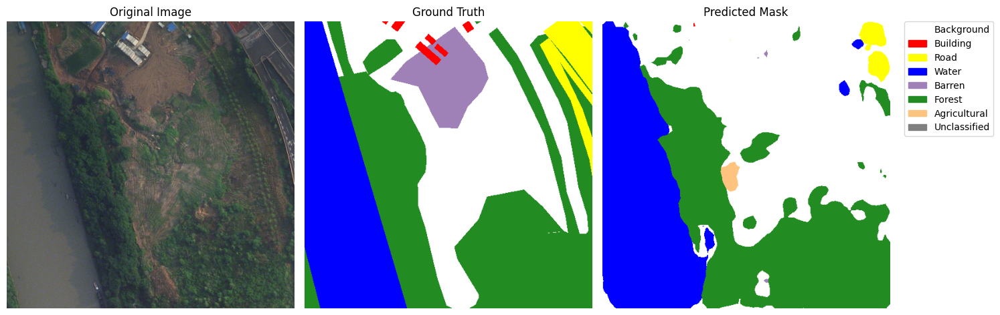

Starting epoch 2/20, LR = [1e-06]
len of source_loader is 57, len of target_loader is 68. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/57 [00:00<?, ?it/s]

loss_stdc: 6.413641452789307 --- 

  2%|▏         | 1/57 [00:01<01:36,  1.73s/it]

loss_mixed: 9.67237377166748 --- loss_complete: 16.086015224456787 --- 

100%|██████████| 57/57 [00:40<00:00,  1.42it/s]
14it [00:06,  2.03it/s]


Epoch 2, mIoU_s = 0.30709272623062134, mIoU_t = 0.21850961446762085, difference = 0.08858311176300049
[EPOCH 02] Avg. Losses:
loss_complete        0.937967
loss_stdc            0.394289
loss_mixed           0.543678


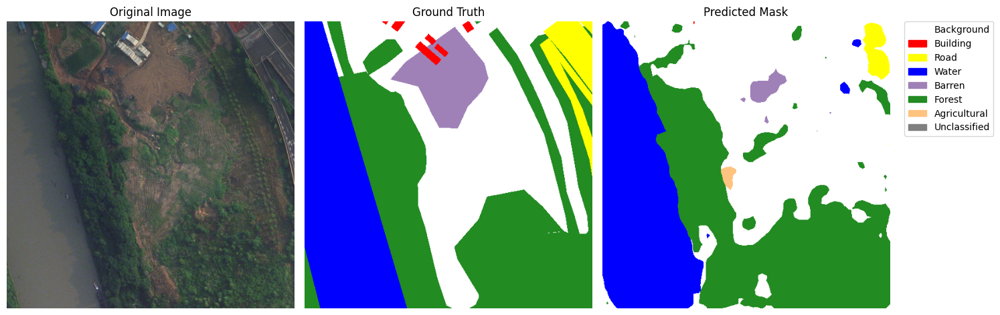

Starting epoch 3/20, LR = [1e-06]
len of source_loader is 57, len of target_loader is 68. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/57 [00:00<?, ?it/s]

loss_stdc: 6.930965423583984 --- 

  2%|▏         | 1/57 [00:01<01:41,  1.82s/it]

loss_mixed: 9.41513442993164 --- loss_complete: 16.346099853515625 --- 

100%|██████████| 57/57 [00:40<00:00,  1.41it/s]
14it [00:06,  2.06it/s]


Epoch 3, mIoU_s = 0.2999061942100525, mIoU_t = 0.22271819412708282, difference = 0.07718800008296967
[EPOCH 03] Avg. Losses:
loss_complete        0.929369
loss_stdc            0.395545
loss_mixed           0.533824


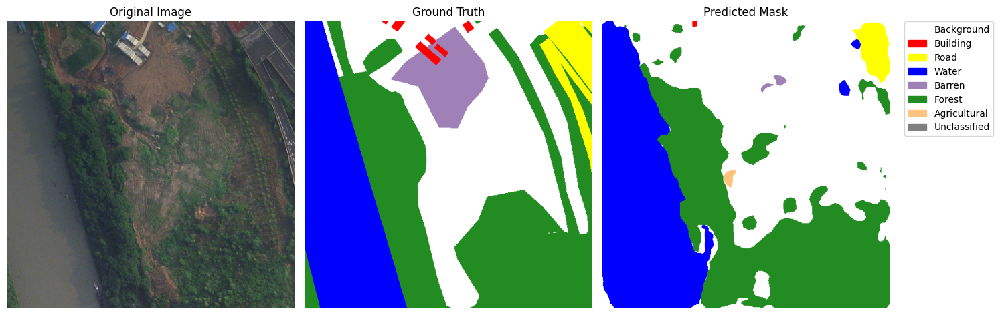

Starting epoch 4/20, LR = [1e-06]
len of source_loader is 57, len of target_loader is 68. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/57 [00:00<?, ?it/s]

loss_stdc: 6.125583648681641 --- 

  2%|▏         | 1/57 [00:01<01:37,  1.74s/it]

loss_mixed: 7.78158712387085 --- loss_complete: 13.90717077255249 --- 

100%|██████████| 57/57 [00:40<00:00,  1.40it/s]
14it [00:06,  2.04it/s]


Epoch 4, mIoU_s = 0.2877144515514374, mIoU_t = 0.21800893545150757, difference = 0.06970551609992981
[EPOCH 04] Avg. Losses:
loss_complete        0.936626
loss_stdc            0.396650
loss_mixed           0.539976


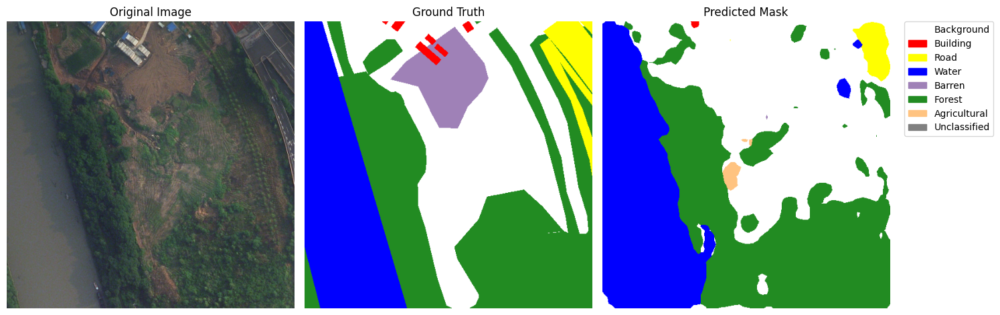

Starting epoch 5/20, LR = [1e-06]
len of source_loader is 57, len of target_loader is 68. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/57 [00:00<?, ?it/s]

loss_stdc: 6.380548000335693 --- 

  2%|▏         | 1/57 [00:01<01:40,  1.80s/it]

loss_mixed: 8.607382774353027 --- loss_complete: 14.98793077468872 --- 

100%|██████████| 57/57 [00:40<00:00,  1.41it/s]
14it [00:06,  2.03it/s]


Epoch 5, mIoU_s = 0.3130894601345062, mIoU_t = 0.21796861290931702, difference = 0.09512084722518921
[EPOCH 05] Avg. Losses:
loss_complete        0.921549
loss_stdc            0.393883
loss_mixed           0.527666


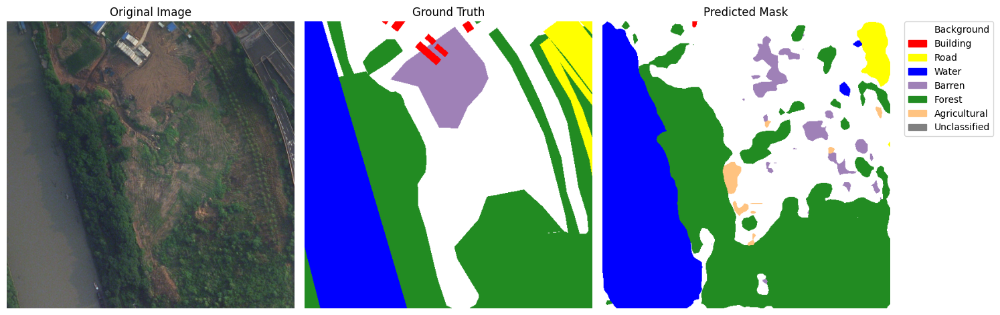

Starting epoch 6/20, LR = [1e-06]
len of source_loader is 57, len of target_loader is 68. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/57 [00:00<?, ?it/s]

loss_stdc: 6.408077239990234 --- 

  2%|▏         | 1/57 [00:01<01:39,  1.78s/it]

loss_mixed: 8.708224296569824 --- loss_complete: 15.116301536560059 --- 

100%|██████████| 57/57 [00:40<00:00,  1.41it/s]
14it [00:06,  2.04it/s]


Epoch 6, mIoU_s = 0.31226834654808044, mIoU_t = 0.2189592868089676, difference = 0.09330905973911285
[EPOCH 06] Avg. Losses:
loss_complete        0.935912
loss_stdc            0.394332
loss_mixed           0.541580


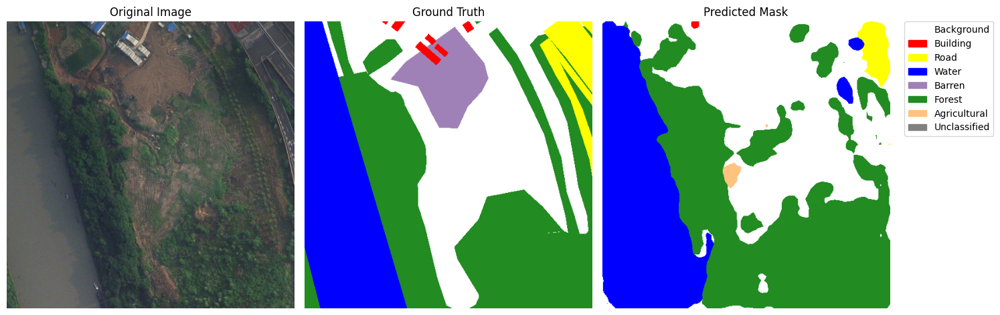

Starting epoch 7/20, LR = [1e-06]
len of source_loader is 57, len of target_loader is 68. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/57 [00:00<?, ?it/s]

loss_stdc: 6.098930358886719 --- 

  2%|▏         | 1/57 [00:01<01:39,  1.77s/it]

loss_mixed: 9.616832733154297 --- loss_complete: 15.715763092041016 --- 

100%|██████████| 57/57 [00:40<00:00,  1.41it/s]
14it [00:07,  2.00it/s]


Epoch 7, mIoU_s = 0.3170066773891449, mIoU_t = 0.21872049570083618, difference = 0.09828618168830872
[EPOCH 07] Avg. Losses:
loss_complete        0.933668
loss_stdc            0.394563
loss_mixed           0.539105


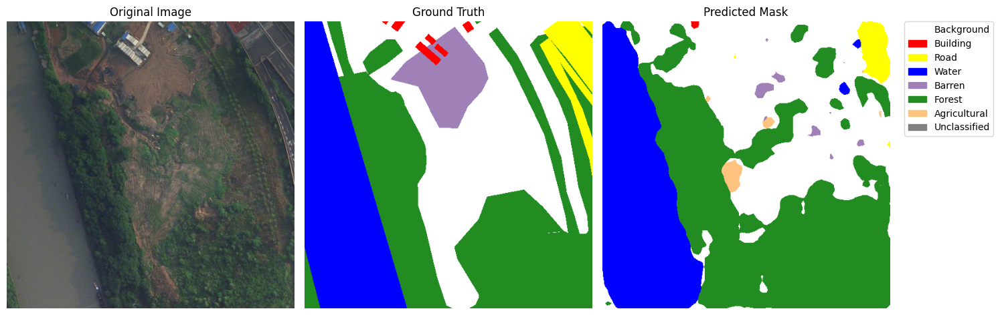

Starting epoch 8/20, LR = [1e-06]
len of source_loader is 57, len of target_loader is 68. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/57 [00:00<?, ?it/s]

loss_stdc: 6.185293674468994 --- 

  2%|▏         | 1/57 [00:01<01:38,  1.76s/it]

loss_mixed: 9.118738174438477 --- loss_complete: 15.30403184890747 --- 

100%|██████████| 57/57 [00:40<00:00,  1.41it/s]
14it [00:06,  2.04it/s]


Epoch 8, mIoU_s = 0.3055390417575836, mIoU_t = 0.2159281224012375, difference = 0.08961091935634613
[EPOCH 08] Avg. Losses:
loss_complete        0.916251
loss_stdc            0.393376
loss_mixed           0.522875


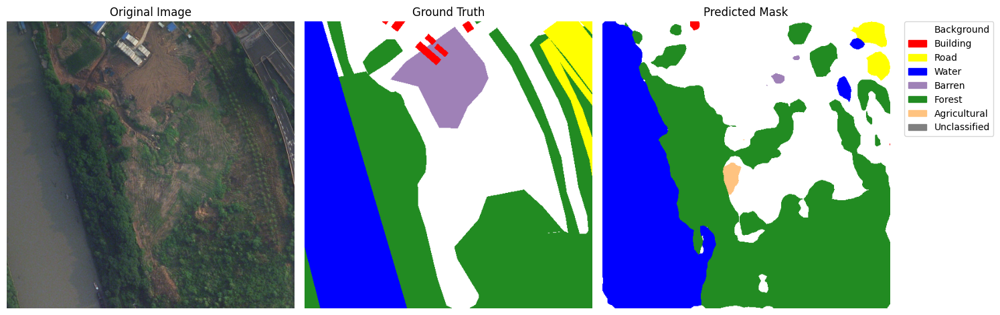

Starting epoch 9/20, LR = [1e-06]
len of source_loader is 57, len of target_loader is 68. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/57 [00:00<?, ?it/s]

loss_stdc: 6.000214576721191 --- 

  2%|▏         | 1/57 [00:01<01:36,  1.72s/it]

loss_mixed: 9.973018646240234 --- loss_complete: 15.973233222961426 --- 

100%|██████████| 57/57 [00:40<00:00,  1.41it/s]
14it [00:06,  2.03it/s]


Epoch 9, mIoU_s = 0.3115793466567993, mIoU_t = 0.22018548846244812, difference = 0.0913938581943512
[EPOCH 09] Avg. Losses:
loss_complete        0.931907
loss_stdc            0.396549
loss_mixed           0.535359


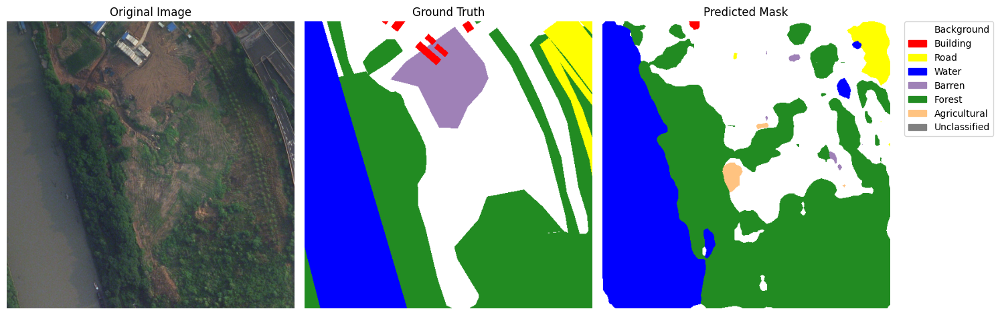

Starting epoch 10/20, LR = [1e-06]
len of source_loader is 57, len of target_loader is 68. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/57 [00:00<?, ?it/s]

loss_stdc: 6.393238067626953 --- 

  2%|▏         | 1/57 [00:01<01:37,  1.74s/it]

loss_mixed: 8.311553001403809 --- loss_complete: 14.704791069030762 --- 

100%|██████████| 57/57 [00:40<00:00,  1.41it/s]
14it [00:06,  2.05it/s]


Epoch 10, mIoU_s = 0.31505632400512695, mIoU_t = 0.22105753421783447, difference = 0.09399878978729248
[EPOCH 10] Avg. Losses:
loss_complete        0.916599
loss_stdc            0.394923
loss_mixed           0.521675


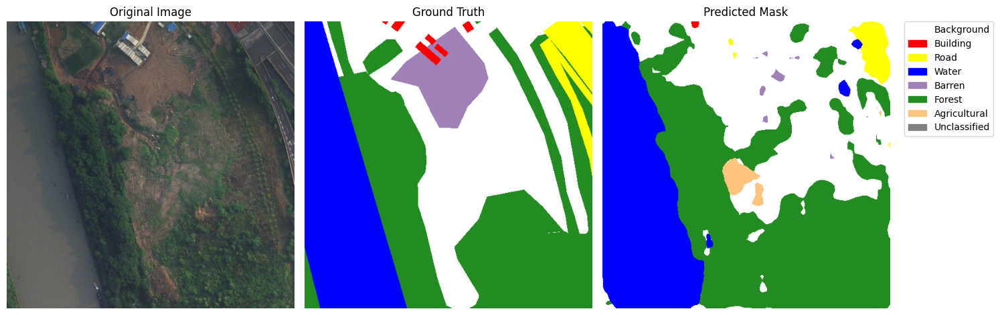

Starting epoch 11/20, LR = [1e-06]
len of source_loader is 57, len of target_loader is 68. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/57 [00:00<?, ?it/s]

loss_stdc: 6.365151405334473 --- 

  2%|▏         | 1/57 [00:01<01:40,  1.80s/it]

loss_mixed: 9.784984588623047 --- loss_complete: 16.15013599395752 --- 

100%|██████████| 57/57 [00:40<00:00,  1.41it/s]
14it [00:06,  2.03it/s]


Epoch 11, mIoU_s = 0.312212198972702, mIoU_t = 0.22318020462989807, difference = 0.08903199434280396
Best RURAL mIoU model on validation split. Saving
.__bestmIoURural.pth model succesfully saved on drive. RURAL mIoU went down to 0.22318020462989807
[EPOCH 11] Avg. Losses:
loss_complete        0.927330
loss_stdc            0.393417
loss_mixed           0.533913


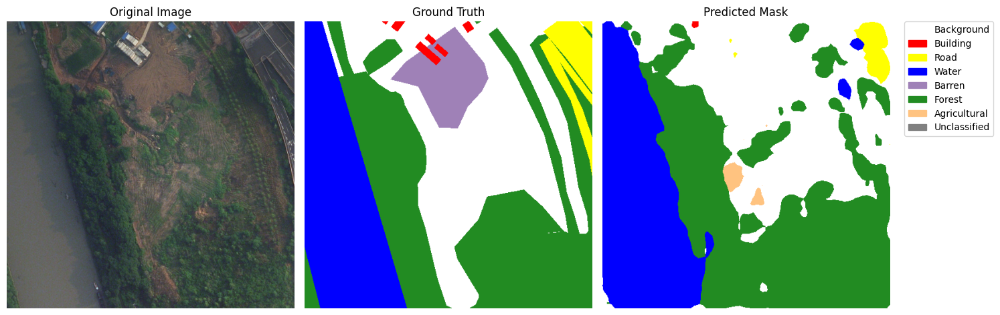

Starting epoch 12/20, LR = [1e-06]
len of source_loader is 57, len of target_loader is 68. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/57 [00:00<?, ?it/s]

loss_stdc: 6.093325614929199 --- 

  2%|▏         | 1/57 [00:01<01:38,  1.76s/it]

loss_mixed: 7.032426834106445 --- loss_complete: 13.125752449035645 --- 

100%|██████████| 57/57 [00:40<00:00,  1.41it/s]
14it [00:06,  2.01it/s]


Epoch 12, mIoU_s = 0.3132026195526123, mIoU_t = 0.21907183527946472, difference = 0.09413078427314758
[EPOCH 12] Avg. Losses:
loss_complete        0.934922
loss_stdc            0.396546
loss_mixed           0.538376


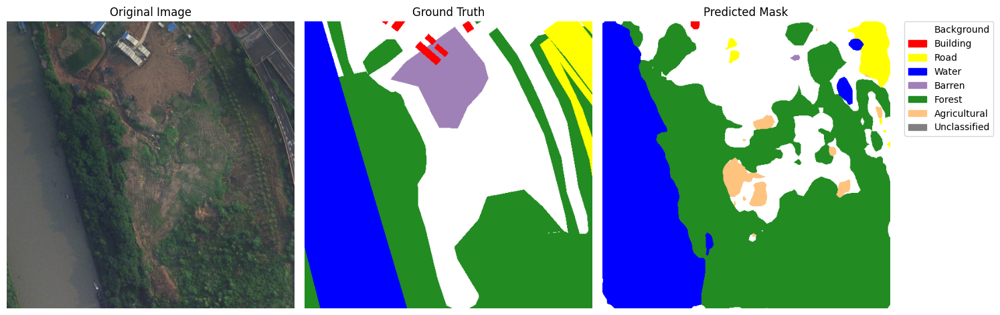

Starting epoch 13/20, LR = [1e-06]
len of source_loader is 57, len of target_loader is 68. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/57 [00:00<?, ?it/s]

loss_stdc: 6.716736793518066 --- 

  2%|▏         | 1/57 [00:01<01:41,  1.80s/it]

loss_mixed: 11.6553955078125 --- loss_complete: 18.372132301330566 --- 

100%|██████████| 57/57 [00:40<00:00,  1.41it/s]
14it [00:06,  2.04it/s]


Epoch 13, mIoU_s = 0.3268563747406006, mIoU_t = 0.23050230741500854, difference = 0.09635406732559204
Best RURAL mIoU model on validation split. Saving
.__bestmIoURural.pth model succesfully saved on drive. RURAL mIoU went down to 0.23050230741500854
[EPOCH 13] Avg. Losses:
loss_complete        0.926539
loss_stdc            0.395084
loss_mixed           0.531455


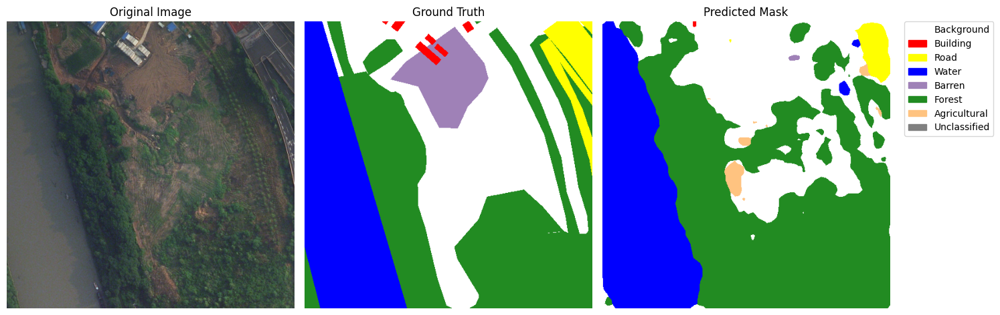

Starting epoch 14/20, LR = [1e-06]
len of source_loader is 57, len of target_loader is 68. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/57 [00:00<?, ?it/s]

loss_stdc: 6.700928211212158 --- 

  2%|▏         | 1/57 [00:01<01:41,  1.80s/it]

loss_mixed: 8.806453704833984 --- loss_complete: 15.507381916046143 --- 

100%|██████████| 57/57 [00:40<00:00,  1.41it/s]
14it [00:06,  2.01it/s]


Epoch 14, mIoU_s = 0.3169054388999939, mIoU_t = 0.22728309035301208, difference = 0.08962234854698181
[EPOCH 14] Avg. Losses:
loss_complete        0.909429
loss_stdc            0.393454
loss_mixed           0.515975


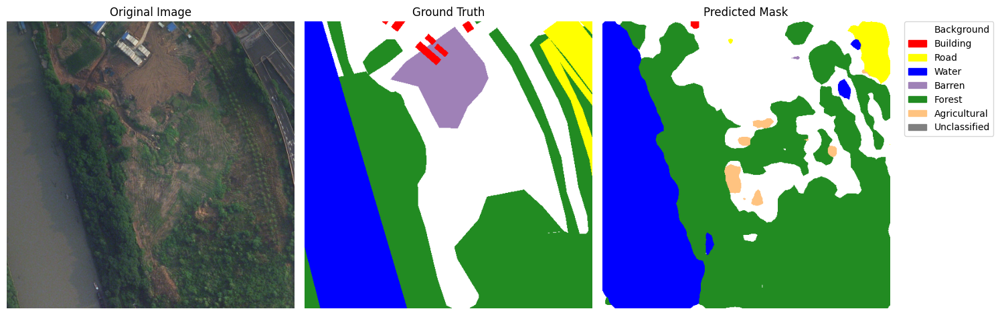

Starting epoch 15/20, LR = [1e-06]
len of source_loader is 57, len of target_loader is 68. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/57 [00:00<?, ?it/s]

loss_stdc: 5.949992656707764 --- 

  2%|▏         | 1/57 [00:01<01:38,  1.76s/it]

loss_mixed: 8.39428424835205 --- loss_complete: 14.344276905059814 --- 

100%|██████████| 57/57 [00:40<00:00,  1.41it/s]
14it [00:06,  2.02it/s]


Epoch 15, mIoU_s = 0.3294157087802887, mIoU_t = 0.2287844866514206, difference = 0.1006312221288681
[EPOCH 15] Avg. Losses:
loss_complete        0.907736
loss_stdc            0.393733
loss_mixed           0.514004


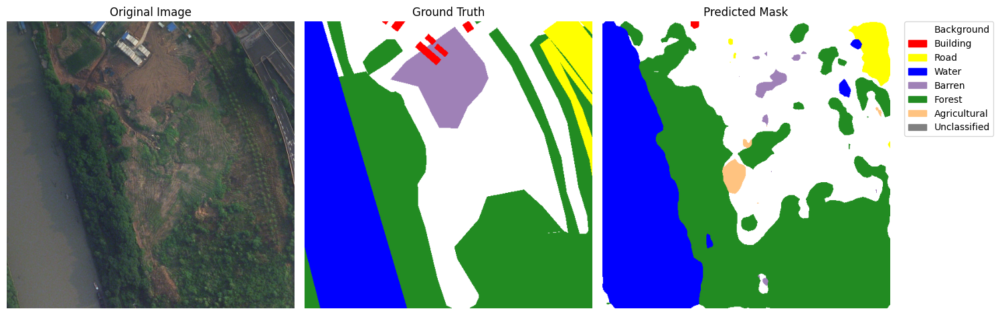

Starting epoch 16/20, LR = [1e-06]
len of source_loader is 57, len of target_loader is 68. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/57 [00:00<?, ?it/s]

loss_stdc: 6.181300163269043 --- 

  2%|▏         | 1/57 [00:01<01:42,  1.83s/it]

loss_mixed: 7.80833625793457 --- loss_complete: 13.989636421203613 --- 

100%|██████████| 57/57 [00:40<00:00,  1.41it/s]
14it [00:06,  2.02it/s]


Epoch 16, mIoU_s = 0.34916913509368896, mIoU_t = 0.22849860787391663, difference = 0.12067052721977234
[EPOCH 16] Avg. Losses:
loss_complete        0.916516
loss_stdc            0.394900
loss_mixed           0.521615


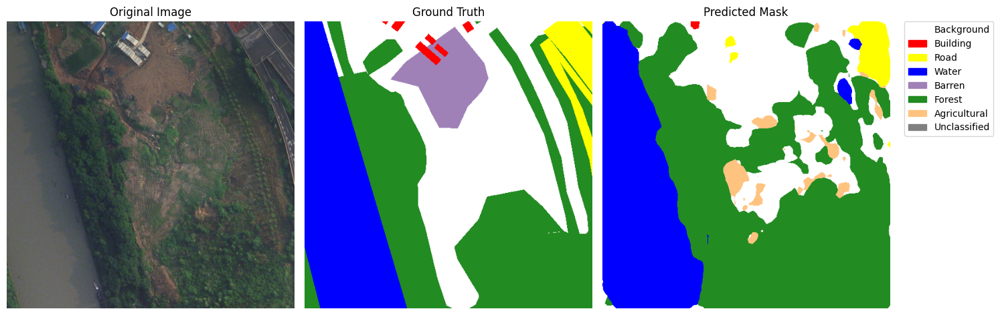

Starting epoch 17/20, LR = [1e-06]
len of source_loader is 57, len of target_loader is 68. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/57 [00:00<?, ?it/s]

loss_stdc: 6.232921600341797 --- 

  2%|▏         | 1/57 [00:01<01:46,  1.90s/it]

loss_mixed: 8.131468772888184 --- loss_complete: 14.36439037322998 --- 

100%|██████████| 57/57 [00:40<00:00,  1.40it/s]
14it [00:06,  2.02it/s]


Epoch 17, mIoU_s = 0.34613746404647827, mIoU_t = 0.23084622621536255, difference = 0.11529123783111572
Best RURAL mIoU model on validation split. Saving
.__bestmIoURural.pth model succesfully saved on drive. RURAL mIoU went down to 0.23084622621536255
[EPOCH 17] Avg. Losses:
loss_complete        0.909235
loss_stdc            0.393402
loss_mixed           0.515833


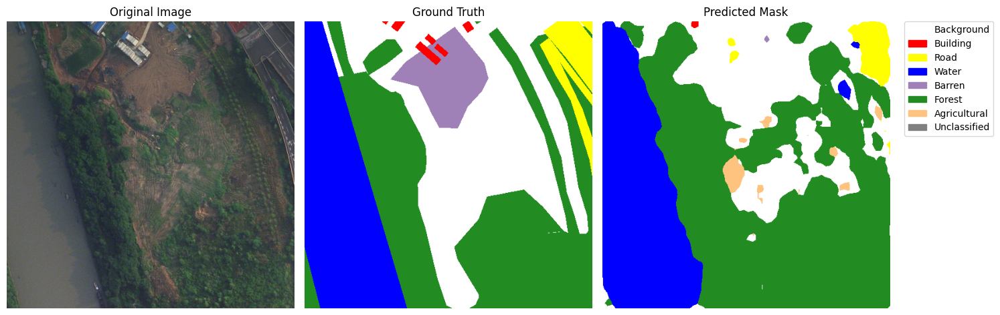

Starting epoch 18/20, LR = [1e-06]
len of source_loader is 57, len of target_loader is 68. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/57 [00:00<?, ?it/s]

loss_stdc: 5.993928909301758 --- 

  2%|▏         | 1/57 [00:01<01:43,  1.85s/it]

loss_mixed: 7.036829948425293 --- loss_complete: 13.03075885772705 --- 

100%|██████████| 57/57 [00:40<00:00,  1.41it/s]
14it [00:07,  1.98it/s]


Epoch 18, mIoU_s = 0.3417992889881134, mIoU_t = 0.23669016361236572, difference = 0.10510912537574768
Best RURAL mIoU model on validation split. Saving
.__bestmIoURural.pth model succesfully saved on drive. RURAL mIoU went down to 0.23669016361236572
[EPOCH 18] Avg. Losses:
loss_complete        0.916628
loss_stdc            0.393291
loss_mixed           0.523336


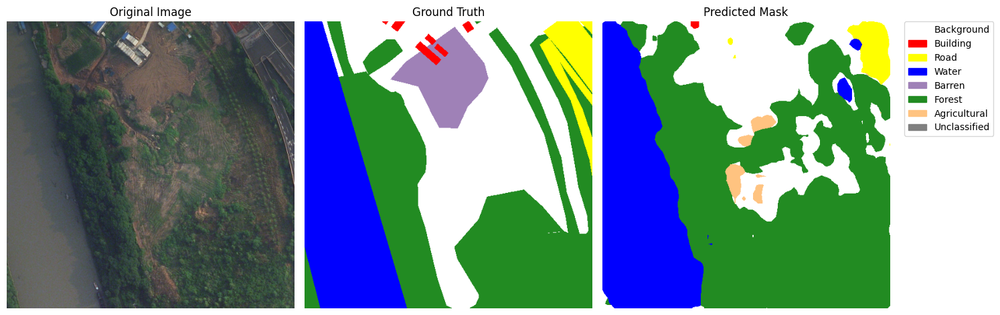

Starting epoch 19/20, LR = [1e-06]
len of source_loader is 57, len of target_loader is 68. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/57 [00:00<?, ?it/s]

loss_stdc: 6.240018844604492 --- 

  2%|▏         | 1/57 [00:01<01:38,  1.76s/it]

loss_mixed: 8.686300277709961 --- loss_complete: 14.926319122314453 --- 

100%|██████████| 57/57 [00:40<00:00,  1.41it/s]
14it [00:07,  1.99it/s]


Epoch 19, mIoU_s = 0.3158722519874573, mIoU_t = 0.2164713740348816, difference = 0.09940087795257568
[EPOCH 19] Avg. Losses:
loss_complete        0.916962
loss_stdc            0.394890
loss_mixed           0.522072


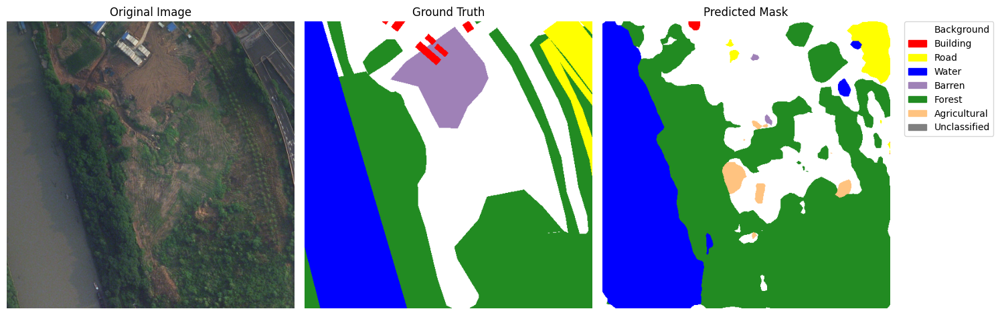

Starting epoch 20/20, LR = [1e-06]
len of source_loader is 57, len of target_loader is 68. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/57 [00:00<?, ?it/s]

loss_stdc: 6.209157943725586 --- 

  2%|▏         | 1/57 [00:01<01:42,  1.84s/it]

loss_mixed: 9.192784309387207 --- loss_complete: 15.401942253112793 --- 

100%|██████████| 57/57 [00:40<00:00,  1.41it/s]
14it [00:07,  1.98it/s]


Epoch 20, mIoU_s = 0.3214101195335388, mIoU_t = 0.22370509803295135, difference = 0.09770502150058746
best_STDC_DACS_model_Resize512__PRETRN=Truebest_model_STDC_Jitter+RotateFlip+Resize.pth__LAMBDA_MIXED=18__LR=1e-06_LRstep=21_pxlwtd=Hard__clswtd=False__DETACH_PSEUDO_MASKS=True__ema=True_alpha=0.99__BldngsRoads=No.pth_20.pth succesfully saved on drive. loss went down to inf
[EPOCH 20] Avg. Losses:
loss_complete        0.901694
loss_stdc            0.394350
loss_mixed           0.507344


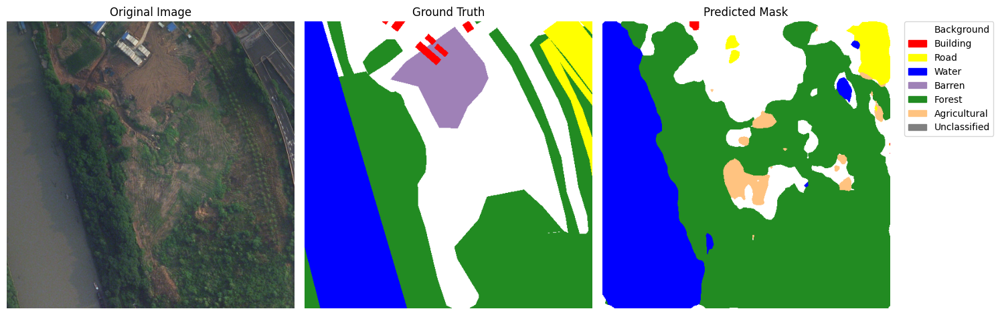

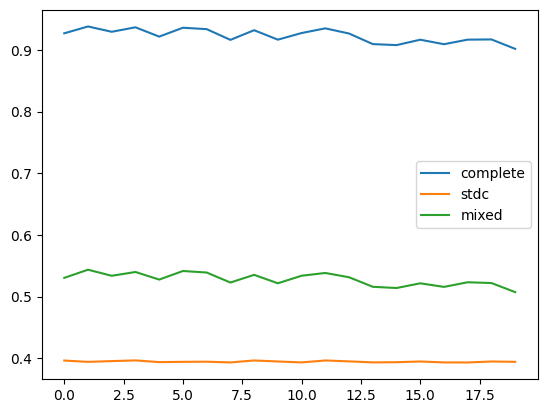

In [34]:
import matplotlib.pyplot as plt
from tqdm import tqdm
import torch
import numpy as np
import torch.nn.functional as F

# For easier debugging
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
os.environ['TORCH_USE_CUDA_DSA'] = '1'

use_boundary_2 = True
use_boundary_4 = True
use_boundary_8 = True

# model is defined in the cell `Load Model`. If you want to load a model pre-tuned on LoveDA modify the code accordingly

for base_model_name in ['best_model_STDC_Jitter+RotateFlip+Resize.pth']:
    if LOAD_BASE_MODEL:
        #base_model_path = os.path.join(drive_path, base_model_name)
        base_model_path = './' + base_model_name
        base_model = torch.load(base_model_path, map_location=DEVICE)
        #   base_model = torch.load(f'/content/{base_model_name}', weights_only=True)
        model.load_state_dict(base_model)

    ## Optimizier and Scheduler
    optimizer = optim.SGD(model.parameters(), lr=LR, momentum=MOMENTUM)
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=STEP_SIZE, gamma=GAMMA)

    if USE_EMA_FOR_TARGET:
        ema_model = create_ema_model(model)
        ema_model.train()
        ema_model = ema_model.to(DEVICE)
        DETACH_PSEUDO_MASKS = True

    if PIXEL_WEIGHTED == False:
        pxlwtd_tag = False
    elif PIXEL_WEIGHT_SOFT:
        pxlwtd_tag = 'Soft'
    else:
        pxlwtd_tag = 'Hard'
    SAVE_MODEL_AS = f'best_STDC_DACS_model_{CHOOSE_TRANSFORM}__PRETRN={LOAD_BASE_MODEL}{base_model_name}__LAMBDA_MIXED={LAMBDA_MIXED}__LR={LR}_LRstep={STEP_SIZE}_pxlwtd={pxlwtd_tag}__clswtd={WEIGH_LOSS_BY_CLASS}__DETACH_PSEUDO_MASKS={DETACH_PSEUDO_MASKS}__ema={USE_EMA_FOR_TARGET}_alpha={ALPHA_TEACHER}__BldngsRoads={TAKE_ONLY_BUILDINGS_AND_ROADS}.pth'
    MODEL_NAME = SAVE_MODEL_AS

    current_step = 0

    best_loss = float('inf')
    best_model = model.state_dict()

    model = model.to(DEVICE)

    plot_losses = {
        'complete' : [],
        'stdc' : [],
        'mixed' : [],
    }

    #mIoU before
    total_union_t = torch.zeros(NUM_CLASSES).to(DEVICE)
    total_intersection_t = torch.zeros(NUM_CLASSES).to(DEVICE)
    total_union_s = torch.zeros(NUM_CLASSES).to(DEVICE)
    total_intersection_s = torch.zeros(NUM_CLASSES).to(DEVICE)
    with torch.no_grad():
        for batch_i, (batch_s, batch_t) in tqdm(enumerate(zip(source_validation_loader, target_validation_loader))):
            images, masks, _, bd_gts = batch_s
            images_t, masks_t, _, _ = batch_t
            images = images.to(DEVICE)
            masks = masks.to(DEVICE)
            bd_gts = bd_gts.float().to(DEVICE)
            images_t = images_t.to(DEVICE)
            masks_t = masks_t.to(DEVICE)
            outputs = model(images)
            outputs_t = model(images_t)
            h, w = masks.size(1), masks.size(2)
            ph, pw = outputs[0].size(2), outputs[0].size(3)
            if ph != h or pw != w:
                for i in range(len(outputs)):
                    outputs[i] = F.interpolate(outputs[i], size=(h, w), mode='bilinear', align_corners=True)
                    outputs_t[i] = F.interpolate(outputs_t[i], size=(h, w), mode='bilinear', align_corners=True)


            ### ========> Calculate mIoU
            ## mIoU on source
            class_indices_s = torch.argmax(outputs[1], dim=1)

            for predicted, target in zip(class_indices_s, masks):
                for i in range(NUM_CLASSES):
                    total_intersection_s[i] += torch.sum(torch.logical_and(predicted == i, target == i))
                    total_union_s[i] += torch.sum(torch.logical_or(predicted == i, target == i))

            ## mIoU on target
            class_indices_t = torch.argmax(outputs_t[1], dim=1)

            for predicted, target in zip(class_indices_t, masks_t):
                for i in range(NUM_CLASSES):
                    total_intersection_t[i] += torch.sum(torch.logical_and(predicted == i, target == i))
                    total_union_t[i] += torch.sum(torch.logical_or(predicted == i, target == i))

        intersection_over_union_s = total_intersection_s / total_union_s
        intersection_over_union_t = total_intersection_t / total_union_t
        mIoU_s = torch.mean(intersection_over_union_s)
        mIoU_t = torch.mean(intersection_over_union_t)
        print(f"mIoU before training. Source: {mIoU_s}. Target = {mIoU_t}")

    best_mIoU_s = 0
    best_mIoU_t = 0

    print(f"training model {SAVE_MODEL_AS}")
    for epoch in range(NUM_EPOCHS):
        model.train()

        # fill with your losses
        epoch_losses = {
            'loss_complete': 0.0,
            'amount': 0, # amt of images I think?
            'loss_stdc': 0.0,
            'loss_mixed': 0.0
        }

        print('Starting epoch {}/{}, LR = {}'.format(epoch+1, NUM_EPOCHS, scheduler.get_lr()))
        srcldr_len = len(source_loader)
        tgtldr_len = len(target_loader)
        print(f"len of source_loader is {srcldr_len}, len of target_loader is {tgtldr_len}. WARNING: make sure source is shorter than target, or modify code to fix early stopping")

        # ================================== Train Epoch X ==================================
        for batch_i, (batch_s, batch_t) in tqdm(enumerate(zip(source_loader, target_loader)), total=len(source_loader)):
            optimizer.zero_grad()

            ### Extract input
            image_list_source, masks_list_source, img_path_source, bd_gts_list_source = batch_s
            image_list_target, _, _, _ = batch_t

            index = 0
            for images, masks, bd_gts, images_t in zip(image_list_source, masks_list_source, bd_gts_list_source, image_list_target):
                ### Extract Images, Masks, Boundaries
                # Source
                images = images.to(DEVICE)
                masks = masks.to(DEVICE)
                bd_gts = bd_gts.float().to(DEVICE)
                # print(f"DEBUG: source_image batch shape: {images.shape}")
                # print(f"DEBUG: source_mask batch shape: {masks.shape}")

                # Target
                images_t = images_t.to(DEVICE)
                # print(f"DEBUG: target_image batch shape: {images.shape}")


                ### ===> Forward, Compute Losses on Source
                ## Forward
                outputs = model(images) # in model.train() mode batch size must be > 1 I think

                if use_boundary_2 and use_boundary_4 and use_boundary_8:
                    out, out16, out32, detail2, detail4, detail8 = outputs

                if (not use_boundary_2) and use_boundary_4 and use_boundary_8:
                    out, out16, out32, detail4, detail8 = outputs

                if (not use_boundary_2) and (not use_boundary_4) and use_boundary_8:
                    out, out16, out32, detail8 = outputs

                if (not use_boundary_2) and (not use_boundary_4) and (not use_boundary_8):
                    out, out16, out32 = outputs


                # Compute boundary loss
                boundary_loss_func = DetailAggregateLoss().to(DEVICE)
                boundary_bce_loss = 0.
                boundary_dice_loss = 0.


                if use_boundary_2:
                    boundary_bce_loss2, boundary_dice_loss2 = boundary_loss_func(detail2, masks)
                    boundary_bce_loss += boundary_bce_loss2
                    boundary_dice_loss += boundary_dice_loss2

                if use_boundary_4:
                    boundary_bce_loss4, boundary_dice_loss4 = boundary_loss_func(detail4, masks)
                    boundary_bce_loss += boundary_bce_loss4
                    boundary_dice_loss += boundary_dice_loss4

                if use_boundary_8:
                    boundary_bce_loss8, boundary_dice_loss8 = boundary_loss_func(detail8, masks)
                    boundary_bce_loss += boundary_bce_loss8
                    boundary_dice_loss += boundary_dice_loss8

                ## Losses
                # Semantic Losses
                # print(f"shape of out is {out.shape}. Shape of masks is {masks.shape}")
                loss_s = sem_loss([out], masks)
                loss_2 = sem_loss([out16], masks)
                loss_3 = sem_loss([out32], masks)


                # Complete Loss
                loss_stdc = loss_s + loss_2 + loss_3 + boundary_bce_loss + boundary_dice_loss
                if batch_i % LOG_FREQUENCY == 0:
                    print(f'loss_stdc: {loss_stdc.item()}', end=" --- ")
                epoch_losses['loss_stdc'] += loss_stdc.item()
                epoch_losses['loss_complete'] += loss_stdc.item()

                loss_stdc.backward()
                ### <=== Forward, Compute Losses on Source

                ### ===> Train Segmentation --- on Mixed
                # for the time being optimize only the main output
                weak_augmented_target = apply_augmentations(images_t, TARGET_TRANSFORMS)

                ## Forward
                if USE_EMA_FOR_TARGET:
                    outputs_t = ema_model(weak_augmented_target)
                else:
                    outputs_t = model(weak_augmented_target)

                if use_boundary_2 and use_boundary_4 and use_boundary_8:
                    out_t, out16_t, out32_t, detail2_t, detail4_t, detail8_t = outputs_t
                if (not use_boundary_2) and use_boundary_4 and use_boundary_8:
                    out_t, out16_t, out32_t, detail4_t, detail8_t = outputs
                if (not use_boundary_2) and (not use_boundary_4) and use_boundary_8:
                    out_t, out16_t, out32_t, detail8_t = outputs
                if (not use_boundary_2) and (not use_boundary_4) and (not use_boundary_8):
                    out_t, out16_t, out32_t = outputs

                output_t = out_t

                ## Create pseudo masks
                if DETACH_PSEUDO_MASKS:
                    output_t = out_t.detach()
                pseudo_label = torch.softmax(output_t, dim=1)
                max_probs, pseudo_masks = torch.max(pseudo_label, dim=1)
                # pseudo_masks = torch.argmax(output_t, dim=1)  # Get predicted classes

                ## Extract MixMasks
                MixMasks = []
                for i in range(images.size(0)):
                    if TAKE_ONLY_BUILDINGS_AND_ROADS == 'Hard':
                        MixMask = generate_class_mask(masks[i], select_build_and_road_for_mix('Hard')).unsqueeze(0)
                    elif TAKE_ONLY_BUILDINGS_AND_ROADS == 'Soft':
                        MixMask = generate_class_mask(masks[i], select_build_and_road_for_mix('Soft', extract_classes_from_mask(masks[i]))).unsqueeze(0)
                    else:
                        MixMask = generate_class_mask(masks[i], select_classes_for_mix(extract_classes_from_mask(masks[i]))).unsqueeze(0)

                    if REV_TAKE_ONLY_BUILDINGS_AND_ROADS == 'Buildings':
                        MixMask[pseudo_masks[i].unsqueeze(0) == 1] = 1
                    elif REV_TAKE_ONLY_BUILDINGS_AND_ROADS == 'BuildingsAndRoads':
                        MixMask[pseudo_masks[i].unsqueeze(0) == 1] = 1
                        MixMask[pseudo_masks[i].unsqueeze(0) == 2] = 1
                    MixMasks.append(MixMask)
                MixMasks = torch.stack(MixMasks, dim=0)
                MixMasks = MixMasks.to(DEVICE)

                ## Mix images
                source_target_stacked_imgs = torch.stack([images, images_t], dim=0)
                source_target_stacked_masks = torch.stack([masks, pseudo_masks], dim=0)
                mixed_images, _ = do_mixing_fullbatch(MixMasks, batch_data=source_target_stacked_imgs)
                _, mixed_masks = do_mixing_fullbatch(MixMasks, batch_target=source_target_stacked_masks)

                outputs_m = model(mixed_images)
                if use_boundary_2 and use_boundary_4 and use_boundary_8:
                    out_m, out16_m, out32_m, detail2_m, detail4_m, detail8_m = outputs_m
                if (not use_boundary_2) and use_boundary_4 and use_boundary_8:
                    out_m, out16_m, out32_m, detail4_m, detail8_m = outputs
                if (not use_boundary_2) and (not use_boundary_4) and use_boundary_8:
                    out_m, out16_m, out32_m, detail8_m = outputs
                if (not use_boundary_2) and (not use_boundary_4) and (not use_boundary_8):
                    out_m, out16_m, out32_m = outputs

                output_m = out_m

                ## Weight based on confidence
                if PIXEL_WEIGHTED:
                    pixelWiseWeight = max_probs.ge(0.968).float().to(DEVICE)

                    if PIXEL_WEIGHT_SOFT:
                        # by using a big power, really low confidence predictions are set to much lower weights
                        softWeights = torch.pow(max_probs, 5, out=max_probs).to(DEVICE)
                        pixelWiseWeight[pixelWiseWeight == 0] = softWeights[pixelWiseWeight == 0]
                        # del softWeights

                    if WEIGH_LOSS_BY_CLASS:
                        pixelWiseWeight = weigh_loss_by_class(pixelWiseWeight)

                    onesWeights = torch.ones((pixelWiseWeight.shape)).to(DEVICE)
                    target_stacked_weights = torch.stack([onesWeights, pixelWiseWeight], dim=0)
                    _, pixelWiseWeight = do_mixing_fullbatch(MixMasks, batch_target=target_stacked_weights)
                else:
                    pixelWiseWeight = 1

                                # Careful: sem_loss hardcodes some weights, but the weight for single output loss calculation is 1, thus using it as of now is fine
                loss_mixed = LAMBDA_MIXED * mix_ce_loss_wtd(output_m, mixed_masks, pixelWiseWeight)
                if batch_i % LOG_FREQUENCY == 0:
                    print(f'loss_mixed: {loss_mixed.item()}', end=" --- ")
                epoch_losses['loss_mixed'] += loss_mixed.item()
                epoch_losses['loss_complete'] += loss_mixed.item()

                loss_mixed.backward()
                ### <=== Train Segmentation --- on Mixed

                if batch_i % LOG_FREQUENCY == 0:
                    print(f'loss_complete: {loss_stdc.item() + loss_mixed.item()}', end=" --- ")

                optimizer.step()
                if USE_EMA_FOR_TARGET:
                    ema_model = update_ema_variables(ema_model, model)
                epoch_losses['amount'] += images.size(0)

        # ================================== Validation Main Model ==================================
        # Validate model on the evaluation set and save the parameters if is better than best model
        model.eval()

        total_union_t = torch.zeros(NUM_CLASSES).to(DEVICE)
        total_intersection_t = torch.zeros(NUM_CLASSES).to(DEVICE)
        total_union_s = torch.zeros(NUM_CLASSES).to(DEVICE)
        total_intersection_s = torch.zeros(NUM_CLASSES).to(DEVICE)

        amount = 0

        outputs = []
        with torch.no_grad():
            for batch_i, (batch_s, batch_t) in tqdm(enumerate(zip(source_validation_loader, target_validation_loader))):
                ### Extract input
                images, masks, _, bd_gts = batch_s
                images_t, masks_t, _, _ = batch_t

                ### Extract Images, Masks, Boundaries
                # Source
                images = images.to(DEVICE)
                masks = masks.to(DEVICE)
                bd_gts = bd_gts.float().to(DEVICE)

                # Target
                images_t = images_t.to(DEVICE)
                masks_t = masks_t.to(DEVICE) # WARNING: idk if taking the labels of Rural for the validation is legal

                ### ===> Forward, Compute mIoU on Source
                ## Forward
                outputs = model(images) # in model.train() mode batch size must be > 1 I think

                if use_boundary_2 and use_boundary_4 and use_boundary_8:
                    out, out16, out32, detail2, detail4, detail8 = outputs
                if (not use_boundary_2) and use_boundary_4 and use_boundary_8:
                    out, out16, out32, detail4, detail8 = outputs
                if (not use_boundary_2) and (not use_boundary_4) and use_boundary_8:
                    out, out16, out32, detail8 = outputs
                if (not use_boundary_2) and (not use_boundary_4) and (not use_boundary_8):
                    out, out16, out32 = outputs

                ## mIoU on source
                class_indices_s = torch.argmax(out, dim=1)

                for predicted, target in zip(class_indices_s, masks):
                    for i in range(NUM_CLASSES):
                        total_intersection_s[i] += torch.sum(torch.logical_and(predicted == i, target == i))
                        total_union_s[i] += torch.sum(torch.logical_or(predicted == i, target == i))
                ### <=== Forward, Compute mIoU on Source

                ### ===> Validate Segmentation --- on Target
                ## Forward
                outputs_t = model(images_t)
                if use_boundary_2 and use_boundary_4 and use_boundary_8:
                    out_t, out16_t, out32_t, detail2_t, detail4_t, detail8_t = outputs_t
                if (not use_boundary_2) and use_boundary_4 and use_boundary_8:
                    out_t, out16_t, out32_t, detail4_t, detail8_t = outputs
                if (not use_boundary_2) and (not use_boundary_4) and use_boundary_8:
                    out_t, out16_t, out32_t, detail8_t = outputs
                if (not use_boundary_2) and (not use_boundary_4) and (not use_boundary_8):
                    out_t, out16_t, out32_t = outputs

                # mIoU on target
                class_indices_t = torch.argmax(out_t, dim=1)

                for predicted, target in zip(class_indices_t, masks_t):
                    for i in range(NUM_CLASSES):
                        total_intersection_t[i] += torch.sum(torch.logical_and(predicted == i, target == i))
                        total_union_t[i] += torch.sum(torch.logical_or(predicted == i, target == i))
                ### <======== Calculate mIoU

        intersection_over_union_s = total_intersection_s / total_union_s
        intersection_over_union_t = total_intersection_t / total_union_t
        mIoU_s = torch.mean(intersection_over_union_s)
        mIoU_t = torch.mean(intersection_over_union_t)

        print(f'Epoch {epoch+1}, mIoU_s = {mIoU_s}, mIoU_t = {mIoU_t}, difference = {mIoU_s - mIoU_t}')
        if (epoch+1) > DONT_SAVE_BEFORE_EPOCH:
            ### Saving the best mIoU on Rural (target t)
            if mIoU_t > best_mIoU_t:
                best_mIoU_t = mIoU_t
                best_mIoU_t_epoch = epoch
                best_model = model.state_dict()
                #Save in Drive and local
                SAVE_RURAL_MODEL_AS = SAVE_MODEL_AS[-4] + '__bestmIoURural.pth'
                torch.save(best_model, SAVE_RURAL_MODEL_AS)
                print("===========================================")
                print("Best RURAL mIoU model on validation split. Saving")
                if SAVE_ON_DRIVE:
                    !cp {SAVE_RURAL_MODEL_AS} /content/drive/MyDrive/LoveDA/{SAVE_RURAL_MODEL_AS}
                    print(f"{SAVE_RURAL_MODEL_AS} model succesfully saved on drive. RURAL mIoU went down to {best_mIoU_t}")

            # ### Saving the best mIoU on Urban (not our focus but let's see) (source s)
            # if mIoU_s > best_mIoU_s:
            #     best_mIoU_s = mIoU_s
            #        best_mIoU_s_epoch = epoch
            #     best_model = model.state_dict()
            #     #Save in Drive and local
            #     SAVE_URBAN_MODEL_AS = SAVE_MODEL_AS[-4] + '__bestmIoUUrban.pth'
            #     torch.save(best_model, SAVE_URBAN_MODEL_AS)
            #     print("===========================================")
            #     print("BEST MODEL ON VALIDATION SET, SAVING")
            #     if SAVE_ON_DRIVE:
            #         !cp {SAVE_URBAN_MODEL_AS} /content/drive/MyDrive/LoveDA/{SAVE_URBAN_MODEL_AS}
            #         print(f"{SAVE_URBAN_MODEL_AS} model succesfully saved on drive. URBAN mIoU went down to {best_mIoU_s}")

        if (epoch+1) >= SAVE_AFTER_EPOCH:
            torch.save(best_model, f'{MODEL_NAME}_{epoch+1}.pth')# Save model
            if SAVE_ON_DRIVE:
                EPOCH_MODEL_PATH = f'{SAVE_MODEL_AS}_{epoch+1}.pth'
                !cp {EPOCH_MODEL_PATH} /content/drive/MyDrive/LoveDA/{EPOCH_MODEL_PATH}
                print(f"{EPOCH_MODEL_PATH} succesfully saved on drive. loss went down to {best_loss}")

        current_step += 1
        scheduler.step()

        plot_losses['complete'].append(epoch_losses['loss_complete'] / epoch_losses['amount'])
        plot_losses['stdc'].append(epoch_losses['loss_stdc'] / epoch_losses['amount'])
        plot_losses['mixed'].append(epoch_losses['loss_mixed'] / epoch_losses['amount'])

        amt = epoch_losses['amount']
        print(f'[EPOCH {epoch+1:02}] Avg. Losses:')
        print(f'{"loss_complete":<20} {epoch_losses["loss_complete"] / amt:.6f}')
        print(f'{"loss_stdc":<20} {epoch_losses["loss_stdc"] / amt:.6f}')
        print(f'{"loss_mixed":<20} {epoch_losses["loss_mixed"] / amt:.6f}')

        # Create a figure with 1 row and 3 columns
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))

        # Plot the original image
        axes[0].imshow(images[0].permute(1, 2, 0).cpu().numpy())
        axes[0].set_title("Original Image")
        axes[0].axis('off')

        # Plot the ground truth mask
        # axes[1].imshow(masks[0].cpu().numpy())
        # axes[1].set_title("Ground Truth")
        # axes[1].axis('off')

        # # Show mask
        adapted_mask = new_colors_mask(masks[0].cpu().numpy())
        plt.legend(handles=getLegendHandles(), loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)
        axes[1].imshow(adapted_mask)
        axes[1].set_title("Ground Truth")
        axes[1].axis('off')

        # Plot the predicted mask
        # axes[2].imshow(torch.argmax(outputs[0][0], dim=0).cpu().numpy())
        # axes[2].set_title("Predicted Mask")
        # axes[2].axis('off')

        adapted_mask_2 = new_colors_mask(torch.argmax(outputs[0][0], dim=0).cpu().numpy())
        plt.legend(handles=getLegendHandles(), loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)
        axes[2].imshow(adapted_mask_2)
        axes[2].set_title("Predicted Mask")
        axes[2].axis('off')

        # Display the figure
        plt.tight_layout()
        plt.show()

    plt.plot(plot_losses['complete'], label='complete')
    plt.plot(plot_losses['stdc'], label='stdc')
    plt.plot(plot_losses['mixed'], label='mixed')
    plt.legend()
    plt.show()

    try:
        new_name = SAVE_MODEL_AS[:-4] + f'@epch{best_mIoU_t_epoch}.pth'
        os.rename(SAVE_RURAL_MODEL_AS, new_name)
        old_drive_name = f'/content/drive/MyDrive/LoveDA/{SAVE_RURAL_MODEL_AS}'
        new_drive_name = f'/content/drive/MyDrive/LoveDA/{new_name}'
        os.rename(old_drive_name, new_drive_name)
    except Exception as e:
        print("Error while renaming best model to add its epoch: ", e)

In [35]:
print("Models in local are:")
files = os.listdir('.')
models = [f for f in files if f.endswith('.pth')]
for model in models:
    print(model)

Models in local are:
best_STDC_DACS_model_Resize512__PRETRN=Truebest_model_STDC_Jitter+RotateFlip+Resize.pth__LAMBDA_MIXED=18__LR=1e-06_LRstep=21_pxlwtd=Hard__clswtd=False__DETACH_PSEUDO_MASKS=True__ema=True_alpha=0.99__BldngsRoads=No.pth_20.pth
best_STDC_DACS_model_Resize512__PRETRN=Truebest_model_STDC_Jitter+RotateFlip+Resize.pth__LAMBDA_MIXED=18__LR=1e-06_LRstep=21_pxlwtd=Hard__clswtd=False__DETACH_PSEUDO_MASKS=True__ema=True_alpha=0.99__BldngsRoads=No@epch17.pth
model_maxmIOU75.pth
best_model_STDC_Jitter+RotateFlip+Resize.pth


In [36]:
torch.save(best_model, './BEST_MODEL_DACS')

### MixMasks Debug

In [37]:
# import matplotlib.pyplot as plt
# from tqdm import tqdm
# import torch
# import numpy as np
# import torch.nn.functional as F


# model = model.to(DEVICE)
# for batch_i, (batch_s, batch_t) in tqdm(enumerate(zip(source_loader, target_loader)), total=len(source_loader)):
#     if batch_i == 0:
#         continue
#     optimizer.zero_grad()
#     image_list_source, masks_list_source, img_path_source, bd_gts_list_source = batch_s
#     image_list_target, _, _, _ = batch_t

#     index = 0
#     for images, masks, bd_gts, images_t in zip(image_list_source, masks_list_source, bd_gts_list_source, image_list_target):
#         images = images.to(DEVICE)
#         masks = masks.to(DEVICE)
#         images_t = images_t.to(DEVICE)
#         weak_augmented_target = apply_augmentations(images_t, TARGET_TRANSFORMS)
#         outputs_t = model(weak_augmented_target)
#         h, w = images_t.size(2), images_t.size(3)
#         ph, pw = outputs_t[0].size(2), outputs_t[0].size(3)
#         output_t = F.interpolate(outputs_t[-2], size=(h, w), mode='bilinear', align_corners=True)
#         pseudo_masks = torch.softmax(output_t.detach(), dim=1)
#         max_probs, pseudo_labels = torch.max(pseudo_masks, dim=1)

#         # mixed_images, mixed_masks = [], []
#         # for i in range(images.size(0)):
#         #     MixMask = generate_class_mask(masks[i], select_classes_for_mix(extract_classes_from_mask(masks[i]))).unsqueeze(0)

#         #     mixed_img, _ = do_mixing(MixMask, data=torch.cat((images[i].unsqueeze(0), images_t[i].unsqueeze(0)), dim=0))
#         #     _, mixed_mask = do_mixing(MixMask, target=torch.cat((masks[i].unsqueeze(0), pseudos_label[i].unsqueeze(0)), dim=0))

#         #     mixed_images.append(mixed_img.unsqueeze(0))
#         #     mixed_masks.append(mixed_mask)

#         # mixed_images = torch.cat(mixed_images)
#         # mixed_masks = torch.cat(mixed_masks).long()

#         ## Try doing it with batches
#         MixMasks = []
#         for i in range(images.size(0)):
#             # if TAKE_ONLY_BUILDINGS_AND_ROADS == 'Hard':
#             selected_classes = select_build_and_road_for_mix('Hard')
#             print(f"Selected classes using 'Hard' are: {selected_classes}")
#             MixMask = generate_class_mask(masks[i], selected_classes).unsqueeze(0)
#             # elif TAKE_ONLY_BUILDINGS_AND_ROADS == 'Soft':
#             selected_classes = select_build_and_road_for_mix('Soft', extract_classes_from_mask(masks[i]))
#             print(f"Selected classes using 'Soft' are: {selected_classes}")
#                 # MixMask = generate_class_mask(masks[i], selected_classes).unsqueeze(0)
#             # else:
#             selected_classes = select_classes_for_mix(extract_classes_from_mask(masks[i]))
#             print(f"Selected classes at random are: {selected_classes}")
#                 # MixMask = generate_class_mask(masks[i], selected_classes).unsqueeze(0)

#             # if REV_TAKE_ONLY_BUILDINGS_AND_ROADS == 'Buildings':
#             # MixMask[pseudo_labels[i].unsqueeze(0) == 1] = 1
#             # elif REV_TAKE_ONLY_BUILDINGS_AND_ROADS == 'BuildingsAndRoads':
#             MixMask[pseudo_labels[i].unsqueeze(0) == 1] = 1
#             MixMask[pseudo_labels[i].unsqueeze(0) == 2] = 1
#             MixMasks.append(MixMask)
#         MixMasks = torch.stack(MixMasks, dim=0)
#         MixMasks = MixMasks.to(DEVICE)

#         source_target_stacked_imgs = torch.stack([images, images_t], dim=0)
#         source_target_stacked_masks = torch.stack([masks, pseudo_labels], dim=0)

#         mixed_images, _ = do_mixing_fullbatch(MixMasks, batch_data=source_target_stacked_imgs)
#         _, mixed_masks = do_mixing_fullbatch(MixMasks, batch_target=source_target_stacked_masks)
#         break

#     break

In [38]:
# HOW_MANY_IMAGES = 8

# for i in range(HOW_MANY_IMAGES):
#     image = images[i]
#     image_t = images_t[i]
#     mixed_image = mixed_images[i]
#     mask = masks[i]
#     mixed_mask = mixed_masks[i]
#     threshold = 0.6

#     # Create a confident mask for all pixels based on the global threshold
#     confident_mask = max_probs.ge(threshold)

#     #Apply the confident mask to the pseudo_label
#     pseudo_labels = pseudo_labels * confident_mask
#     pseudo_mask = pseudo_labels[i]

#     print(f"Max prob distribution: {max_probs.min()} - {max_probs.max()} - {max_probs.mean()}")

#     fig, axes = plt.subplots(2, 3, figsize=(15, 10))

#     axes = axes.flatten()

#     axes[0].imshow(image.permute(1, 2, 0).cpu().numpy())
#     axes[0].set_title("Original Image")
#     axes[0].axis('off')

#     adapted_mask = new_colors_mask(mask.cpu().numpy())
#     plt.legend(handles=getLegendHandles(), loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)
#     axes[1].imshow(adapted_mask)
#     axes[1].set_title("Mask")
#     axes[1].axis('off')

#     axes[2].imshow(image_t.permute(1, 2, 0).cpu().numpy())
#     axes[2].set_title("Target Image")
#     axes[2].axis('off')

#     axes[3].imshow(mixed_image.permute(1, 2, 0).cpu().numpy())
#     axes[3].set_title("Mixed Image")
#     axes[3].axis('off')

#     adapted_mask_2 = new_colors_mask(mixed_mask.cpu().numpy())
#     plt.legend(handles=getLegendHandles(), loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)
#     axes[4].imshow(adapted_mask_2)
#     axes[4].set_title("Mixed Mask")
#     axes[4].axis('off')

#     adapted_pseudo_mask = new_colors_mask(pseudo_mask.cpu().numpy())
#     plt.legend(handles=getLegendHandles(), loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)
#     axes[5].imshow(adapted_pseudo_mask)
#     axes[5].set_title("Pseudo Mask")
#     axes[5].axis('off')

#     plt.tight_layout()
#     plt.show()

# TEST

### Load other models from drive

In [39]:
# # Run the first cell pls
# import os

# BASE_PATH = "/content/drive/MyDrive/LoveDA/"
# INTEREST = 'best_DACS_model_Resize512__PRETRN=Truebest_model_Resize__bestmIoURural.pth__LAMBDA_MIXED=25__LR=1e-05_LRstep=14_pxlwtd=Hard__clswtd=False__DETACH_PSEUDO_MASKS=True__ema=True_alpha=0.99__bestmIoURural.pth'

# all_mydrive = os.listdir(BASE_PATH)
# all_models = [f for f in all_mydrive if f.endswith('.pth')]
# models_of_interest = [f for f in all_models if INTEREST in f]
# for model_name in models_of_interest:
#     if not os.path.exists(model_name):
#         print(f"Copying {model_name} locally from MyDrive")
#         !cp {BASE_PATH+model_name} .

### Test Loop

In [40]:
!pip install torchmetrics ptflops

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 927.3/927.3 kB 46.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 106.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 87.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 52.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 39.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 17.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 91.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninsta

In [42]:
from torchmetrics import Accuracy
from tqdm import tqdm
import time
import ptflops
import os

IGNORE_UNCLASSIFIED = False
BATCH_SIZE = 32

test_augmentation = AUGMENTATIONS['Resize512']
# target_type = 'ActualTest'
NUM_CLASSES = len(LABEL_MAP)


# Create unweighted models
model = BiSeNet(backbone='STDCNet1446', n_classes=len(LABEL_MAP), pretrain_model=pretrain_path,
    use_boundary_2=True, use_boundary_4=True, use_boundary_8=True,
    use_boundary_16=False, use_conv_last=False)

model_files_paths = [f for f in os.listdir('.') if f.endswith('.pth')]
model_files_paths = [f for f in model_files_paths if f.startswith('best')]
print(model_files_paths)

for model_file_path in model_files_paths:
    best_model = torch.load(model_file_path, weights_only=True)

    model.load_state_dict(best_model)
    model = model.to(DEVICE)

    accuracy, mIoU = True, True


    TARGETs = ['Rural', 'Urban']
    for TARGET in TARGETs:
        if TARGET == 'Urban':
            target_type = 'ActualTest'
            #target_type = 'Validation'
        elif TARGET == 'Rural':
            target_type = 'ActualTest'
            #target_type = 'Total'

        test_dataset = LoveDADataset(baseTransform=test_augmentation, augTransforms=None, split=TARGET, type=target_type, useBoundaries=False)
        test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, drop_last=True, pin_memory=True)

        #### TEST LOOP
        model.eval()
        print(f"Testing model={model_file_path} on domain={TARGET} on a {target_type} split, with ignoring unclassified class to {IGNORE_UNCLASSIFIED}")

        # Latency
        with torch.no_grad():
            start_time = time.time()
            for _ in range(100):
                _ = model(torch.randn(1, 3, RESIZE, RESIZE).to(DEVICE))
            end_time = time.time()
        latency = (end_time - start_time) / 100
        print(f"Latency: {latency:.4f} seconds")

        # FLOPs
        macs, _ = ptflops.get_model_complexity_info(model,
            (3, RESIZE, RESIZE), as_strings=False,
            print_per_layer_stat=False, verbose=False)
        flops = macs * 2  # MACs perform two FLOPs
        print("FLOPs:", flops)

        # Number of parameters
        total_params = sum(p.numel() for p in model.parameters())
        print(f"Total number of parameters: {total_params}")

        with torch.no_grad():
            total_union = torch.zeros(NUM_CLASSES).to(DEVICE)
            total_intersection = torch.zeros(NUM_CLASSES).to(DEVICE)
            meter = Accuracy(task='multiclass', num_classes=NUM_CLASSES).to(DEVICE)
            for (batch) in tqdm(test_loader):
                ### Extract input
                images, masks, img_path, bd_gts = batch
                images = images.float().to(DEVICE)
                masks = masks.to(DEVICE)

                ### ===> Forward, Upscale, Compute Losses
                ## Forward
                outputs = model(images)

                # Output 0 is the prediction

                # Shape: NBATCHES x classes x h x w
                # differently than in the training loop, I realized I can just take outputs[0] instead of expanding the output with out, _, _, ..., which has variable size
                class_indices = torch.argmax(outputs[0], dim=1)  # Shape: NBATCHES x h x w

                if accuracy:
                # Create a mask for valid targets (where target is not -1)
                    valid_mask = (masks != -1)  # Mask of shape: NBATCHES x h x w
                    # Apply the mask to ignore -1 targets when updating the accuracy metric
                    meter.update(class_indices[valid_mask], masks[valid_mask])

                if mIoU:
                    for predicted, target in zip(class_indices, masks):
                        if IGNORE_UNCLASSIFIED:
                          unclassified_mask = target == -1
                          predicted[unclassified_mask] = -1

                        for i in range(NUM_CLASSES):
                            total_intersection[i] += torch.sum(torch.logical_and(predicted == i, target == i))
                            total_union[i] += torch.sum(torch.logical_or(predicted == i, target == i))

        if accuracy:
            accuracy = meter.compute()
            print(f'\nAccuracy on the target domain: {100 * accuracy:.2f}%')

        if mIoU:
            intersection_over_union = total_intersection / total_union

            # Per class IoU
            for i, iou in enumerate(intersection_over_union):
                class_name = list(LABEL_MAP.keys())[list(LABEL_MAP.values()).index(i)]  # Get the class name from LABEL_MAP
                print(f'{class_name} IoU: {iou:.4f}')

            mIoU = torch.mean(intersection_over_union)
            print(f'\nmIoU on the {TARGET} domain: {mIoU}')

        print("========================================================================")


['best_STDC_DACS_model_Resize512__PRETRN=Truebest_model_STDC_Jitter+RotateFlip+Resize.pth__LAMBDA_MIXED=18__LR=1e-06_LRstep=21_pxlwtd=Hard__clswtd=False__DETACH_PSEUDO_MASKS=True__ema=True_alpha=0.99__BldngsRoads=No.pth_20.pth', 'best_STDC_DACS_model_Resize512__PRETRN=Truebest_model_STDC_Jitter+RotateFlip+Resize.pth__LAMBDA_MIXED=18__LR=1e-06_LRstep=21_pxlwtd=Hard__clswtd=False__DETACH_PSEUDO_MASKS=True__ema=True_alpha=0.99__BldngsRoads=No@epch17.pth', 'best_model_STDC_Jitter+RotateFlip+Resize.pth']
Dataset size: 992
Testing model=best_STDC_DACS_model_Resize512__PRETRN=Truebest_model_STDC_Jitter+RotateFlip+Resize.pth__LAMBDA_MIXED=18__LR=1e-06_LRstep=21_pxlwtd=Hard__clswtd=False__DETACH_PSEUDO_MASKS=True__ema=True_alpha=0.99__BldngsRoads=No.pth_20.pth on domain=Rural on a ActualTest split, with ignoring unclassified class to False
Latency: 0.0248 seconds
FLOPs: 44402280704
Total number of parameters: 16074784


100%|██████████| 31/31 [00:28<00:00,  1.09it/s]



Accuracy on the target domain: 41.28%
Background IoU: 0.4116
Building IoU: 0.1996
Road IoU: 0.0955
Water IoU: 0.3281
Barren IoU: 0.0634
Forest IoU: 0.0987
Agricultural IoU: 0.0377

mIoU on the Rural domain: 0.17637135088443756
Dataset size: 677
Testing model=best_STDC_DACS_model_Resize512__PRETRN=Truebest_model_STDC_Jitter+RotateFlip+Resize.pth__LAMBDA_MIXED=18__LR=1e-06_LRstep=21_pxlwtd=Hard__clswtd=False__DETACH_PSEUDO_MASKS=True__ema=True_alpha=0.99__BldngsRoads=No.pth_20.pth on domain=Urban on a ActualTest split, with ignoring unclassified class to False
Latency: 0.0244 seconds
FLOPs: 44402280704
Total number of parameters: 16074784


100%|██████████| 21/21 [00:20<00:00,  1.01it/s]



Accuracy on the target domain: 42.75%
Background IoU: 0.2938
Building IoU: 0.3380
Road IoU: 0.2457
Water IoU: 0.5067
Barren IoU: 0.0891
Forest IoU: 0.3037
Agricultural IoU: 0.0110

mIoU on the Urban domain: 0.2554375231266022
Dataset size: 992
Testing model=best_STDC_DACS_model_Resize512__PRETRN=Truebest_model_STDC_Jitter+RotateFlip+Resize.pth__LAMBDA_MIXED=18__LR=1e-06_LRstep=21_pxlwtd=Hard__clswtd=False__DETACH_PSEUDO_MASKS=True__ema=True_alpha=0.99__BldngsRoads=No@epch17.pth on domain=Rural on a ActualTest split, with ignoring unclassified class to False
Latency: 0.0240 seconds
FLOPs: 44402280704
Total number of parameters: 16074784


100%|██████████| 31/31 [00:26<00:00,  1.17it/s]



Accuracy on the target domain: 41.11%
Background IoU: 0.4003
Building IoU: 0.2129
Road IoU: 0.1036
Water IoU: 0.3356
Barren IoU: 0.0742
Forest IoU: 0.1016
Agricultural IoU: 0.0442

mIoU on the Rural domain: 0.1817760169506073
Dataset size: 677
Testing model=best_STDC_DACS_model_Resize512__PRETRN=Truebest_model_STDC_Jitter+RotateFlip+Resize.pth__LAMBDA_MIXED=18__LR=1e-06_LRstep=21_pxlwtd=Hard__clswtd=False__DETACH_PSEUDO_MASKS=True__ema=True_alpha=0.99__BldngsRoads=No@epch17.pth on domain=Urban on a ActualTest split, with ignoring unclassified class to False
Latency: 0.0239 seconds
FLOPs: 44402280704
Total number of parameters: 16074784


100%|██████████| 21/21 [00:20<00:00,  1.04it/s]



Accuracy on the target domain: 43.23%
Background IoU: 0.2941
Building IoU: 0.3413
Road IoU: 0.2541
Water IoU: 0.5414
Barren IoU: 0.1174
Forest IoU: 0.3059
Agricultural IoU: 0.0128

mIoU on the Urban domain: 0.26672086119651794
Dataset size: 992
Testing model=best_model_STDC_Jitter+RotateFlip+Resize.pth on domain=Rural on a ActualTest split, with ignoring unclassified class to False
Latency: 0.0237 seconds
FLOPs: 44402280704
Total number of parameters: 16074784


100%|██████████| 31/31 [00:26<00:00,  1.17it/s]



Accuracy on the target domain: 41.93%
Background IoU: 0.4096
Building IoU: 0.2372
Road IoU: 0.0960
Water IoU: 0.3517
Barren IoU: 0.0545
Forest IoU: 0.1099
Agricultural IoU: 0.0424

mIoU on the Rural domain: 0.18588070571422577
Dataset size: 677
Testing model=best_model_STDC_Jitter+RotateFlip+Resize.pth on domain=Urban on a ActualTest split, with ignoring unclassified class to False
Latency: 0.0237 seconds
FLOPs: 44402280704
Total number of parameters: 16074784


100%|██████████| 21/21 [00:19<00:00,  1.05it/s]


Accuracy on the target domain: 42.93%
Background IoU: 0.2967
Building IoU: 0.3644
Road IoU: 0.2548
Water IoU: 0.4566
Barren IoU: 0.0929
Forest IoU: 0.3043
Agricultural IoU: 0.0147

mIoU on the Urban domain: 0.2549104690551758
